## Project Description

Capstone Project
IBDM Dataset

This capstone is divided into a 4-phase duration. In this document, the entire details of the 4-phase(weekly) duration are given.

Phase 3

1) Now make only 1 data frame of two CSV files using the join operation of pandas and start doing EDA.

2) Do the complete EDA in detail to explore the insights of data and write detailed observations of each analysis.



Phase 4

1) Write the complete Machine learning code to make predictions of votes and gross collection. Use appropriate models on their label basis. Remember you need to make 2 different predictions: vote and gross collection.

2) Apply all the best techniques of scaling, and hyperparameter tuning, and avoid underfitting or overfitting (bias/variance)

3) At the end save the best model and convey on which basis you have chosen that model.  

## Import Packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import seaborn as sns
sns.set(style='whitegrid')
import warnings 
warnings.filterwarnings('ignore')
from scipy.stats import zscore
from sklearn.linear_model import LogisticRegression,LinearRegression,Lasso,Ridge
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor 
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor,AdaBoostRegressor
import xgboost
from xgboost import XGBRegressor
from sklearn.preprocessing import StandardScaler,PowerTransformer,MinMaxScaler,PolynomialFeatures
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error,accuracy_score
#Module related to VIF 
from statsmodels.stats.outliers_influence import variance_inflation_factor
#Moudles related to feature selection
from sklearn.feature_selection import RFE,SelectKBest,f_classif

### Create UDFs

In [2]:
# Create Data audit Report for continuous variables
def continuous_var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  
                      x.std(), x.var(), x.min(), x.quantile(0.01), x.quantile(0.05),
                          x.quantile(0.10),x.quantile(0.25),x.quantile(0.50),x.quantile(0.75), 
                              x.quantile(0.90),x.quantile(0.95), x.quantile(0.99),x.max()], 
                  index = ['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'MIN', 'P1', 
                               'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])

### Import Data

In [3]:
# load the first csv file 
df1 = pd.read_csv('E:/DataTrained/Capstone_Project/movie_1.csv')
print(df1.head())

# load the second csv file
df2=pd.read_csv('E:/DataTrained/Capstone_Project/movie_2.csv')
print(df2.head())

   Serial no                                         Movie Name  \
0          1                                    The Dark Knight   
1          2      The Lord of the Rings: The Return of the King   
2          3                                          Inception   
3          4  The Lord of the Rings: The Fellowship of the Ring   
4          5              The Lord of the Rings: The Two Towers   

          Director_1 Director_2 Director_3  Duration  Year  Ratings  Metascore  
0  Christopher Nolan        NaN        NaN       152  2008      9.0       84.0  
1      Peter Jackson        NaN        NaN       201  2003      9.0       94.0  
2  Christopher Nolan        NaN        NaN       148  2010      8.8       74.0  
3      Peter Jackson        NaN        NaN       178  2001      8.8       92.0  
4      Peter Jackson        NaN        NaN       179  2002      8.8       87.0  
   Popularity                               Movie_Name       Stars_1  \
0           1                          

In [4]:
# Merge the 2 files to one dataset csv file.
df=pd.merge(df1,df2,how='inner',left_on='Movie Name',right_on='Movie_Name')
#Drop the duplicated column
df.drop('Movie_Name',axis=1,inplace=True)
pd. set_option('display.max_columns', 700)
pd.set_option('display.width', 100)
df

,Serial no,Movie Name,Director_1,Director_2,Director_3,Duration,Year,Ratings,Metascore,Popularity,Stars_1,Stars_2,Stars_3,Stars_4,Votes,Genre_1,Genre_2,Genre_3,Gross_Collection_$M,Certification
0,1,The Dark Knight,Christopher Nolan,NaN,NaN,152,2008,9.0,84.0,35,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2718780,Action,Crime,Drama,534.86,PG-13
1,2,The Lord of the Rings: The Return of the King,Peter Jackson,NaN,NaN,201,2003,9.0,94.0,125,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom,1887419,Action,Adventure,Drama,377.85,PG-13
2,3,Inception,Christopher Nolan,NaN,NaN,148,2010,8.8,74.0,30,Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot Page,Ken Watanabe,2413483,Action,Adventure,Sci-Fi,292.58,PG-13
3,4,The Lord of the Rings: The Fellowship of the Ring,Peter Jackson,NaN,NaN,178,2001,8.8,92.0,57,Elijah Wood,Ian McKellen,Orlando Bloom,Sean Bean,1916063,Action,Adventure,Drama,315.54,PG-13
4,5,The Lord of the Rings: The Two Towers,Peter Jackson,NaN,NaN,179,2002,8.8,87.0,225,Elijah Wood,Ian McKellen,Viggo Mortensen,Orlando Bloom,1703586,Action,Adventure,Drama,342.55,PG-13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1479,1744,House of the Dead,Uwe Boll,NaN,NaN,90,2003,2.1,15.0,1343,Jonathan Cherry,Tyron Leitso,Clint Howard,Ona Grauer,37983,Action,Adventure,Horror,10.25,R
1480,1745,Radhe,Prabhu Deva,NaN,NaN,109,2021,1.9,NaN,1701,Salman Khan,Disha Patani,Randeep Hooda,Jackie Shroff,178807,Action,Crime,Thriller,NaN,TV-MA
1481,1746,Race 3,Remo D'Souza,NaN,NaN,160,2018,1.9,NaN,1702,Anil Kapoor,Salman Khan,Bobby Deol,Jacqueline Fernandez,47587,Action,Crime,Thriller,1.69,Not Rated
1482,1747,Angels Apocalypse,Sean Cain,Enzo Zelocchi,NaN,85,2015,1.7,NaN,1747,Enzo Zelocchi,Jana Rochelle,Ryan C.F. Buckley,William Kirkham,42911,Action,Fantasy,Sci-Fi,NaN,NaN


## Data Inspection

In [5]:
# Shape of the dataset
df.shape

(1484, 20)

The Dataset contain 1484 rows and 20 columns.

In [6]:
# check dulpicated records
df.duplicated().sum()

0

In [7]:
# Let check if any whitespace, 'NA' or '-' exist in dataset.
df.isin([' ','NA','-']).sum().any()

False

There are no duplicated data.

In [8]:
# Dataset information
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1484 entries, 0 to 1483
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Serial no            1484 non-null   int64  
 1   Movie Name           1484 non-null   object 
 2   Director_1           1484 non-null   object 
 3   Director_2           84 non-null     object 
 4   Director_3           4 non-null      object 
 5   Duration             1484 non-null   int64  
 6   Year                 1484 non-null   int64  
 7   Ratings              1484 non-null   float64
 8   Metascore            1350 non-null   float64
 9   Popularity           1484 non-null   int64  
 10  Stars_1              1484 non-null   object 
 11  Stars_2              1483 non-null   object 
 12  Stars_3              1483 non-null   object 
 13  Stars_4              1483 non-null   object 
 14  Votes                1484 non-null   int64  
 15  Genre_1              1484 non-null   o

We have 3 float type, 5 Int Type and 12 Object datatype.

In [9]:
df.Year.max()

2023

In [10]:
# Remove Serial no column for high cardinality
df.drop('Serial no',axis=1,inplace=True)

In [11]:
# Show the columns
df.columns

Index(['Movie Name', 'Director_1', 'Director_2', 'Director_3', 'Duration', 'Year', 'Ratings',
       'Metascore', 'Popularity', 'Stars_1', 'Stars_2', 'Stars_3', 'Stars_4', 'Votes', 'Genre_1',
       'Genre_2', 'Genre_3', 'Gross_Collection_$M', 'Certification'],
      dtype='object')

In [12]:
# Check null values in  data
df.isnull().sum()

Movie Name                0
Director_1                0
Director_2             1400
Director_3             1480
Duration                  0
Year                      0
Ratings                   0
Metascore               134
Popularity                0
Stars_1                   0
Stars_2                   1
Stars_3                   1
Stars_4                   1
Votes                     0
Genre_1                   0
Genre_2                   2
Genre_3                 119
Gross_Collection_$M     202
Certification             4
dtype: int64

These following features: (Director_2,Director_3,Metascore,Genre_2,Genre_3,Gross,Certification,Popularity) have NULL values.

In [13]:
# Value counts for every feature to check the missing again or unique values
for i in df.columns:
    print(df[i].value_counts())
    print('**********************************')

Hellboy                      2
Point Break                  2
RoboCop                      2
Tron                         2
The Magnificent Seven        2
                            ..
Kisi Ka Bhai Kisi Ki Jaan    1
The Maze Runner              1
The Book of Eli              1
Aquaman                      1
Sadak 2                      1
Name: Movie Name, Length: 1455, dtype: int64
**********************************
Michael Bay         15
Tony S              13
Steven Spielberg    12
Antoine Fuqua       11
Roland Emmerich     11
                    ..
Joe Cornish          1
John Dahl            1
Tony Gilroy          1
Andrea Di Stefan     1
Mahesh Bha           1
Name: Director_1, Length: 798, dtype: int64
**********************************
Lilly Wachowski       5
Joe Russo             5
Brian Taylor          4
Christopher Miller    3
Espen Sandberg        3
                     ..
Anouk Whissell        1
Michael Crichton      1
Peter Ramsey          1
Sam Fell              1
Enzo Ze

Description for Certificate:
MPAA (Motion Picture Association of America) Ratings (United States):

G: General Audiences
PG: Parental Guidance Suggested
PG-13: Parents Strongly Cautioned
R: Restricted (Requires accompanying parent or adult guardian for viewers under 17)
NC-17: No One 17 and Under Admitted

In [14]:
# Modify the Certification values
# Define the list for replacement
replace_list_18= ['18+', '18 +', '18TC']
replacement_value_18= '18'
replace_list_17= ['17+', 'NC-17']
replacement_value_17= '17'
replace_list_16= ['16+', '16 +']
replacement_value_16= '16'
replace_list_15= ['PG 15', 'PG-15']
replacement_value_15= '15'
replace_list_13= ['13+', '13 +','M','M/PG']
replacement_value_13= '13'
replace_list_12= ['12+', 'R-12']
replacement_value_12= '12'

In [15]:
# Replace multiple values using the list
df['Certification'] = df.Certification.replace(replace_list_18, replacement_value_18)
df['Certification'] = df.Certification.replace(replace_list_17, replacement_value_17)
df['Certification'] = df.Certification.replace(replace_list_16, replacement_value_16)
df['Certification'] = df.Certification.replace(replace_list_15, replacement_value_15)
df['Certification'] = df.Certification.replace(replace_list_13, replacement_value_13)
df['Certification'] = df.Certification.replace(replace_list_12, replacement_value_12)
df['Certification'] =df.Certification.replace('(Banned)','R')
df['Certification'] =df.Certification.replace('8+','8').replace('7+','7')

In [16]:
# Check the Certification feature again
df.Certification.value_counts()

R            596
PG-13        561
PG           178
Not Rated     76
TV-MA         27
UA            14
G             10
TV-14          6
Approved       4
13             3
U              2
Passed         2
16             1
Name: Certification, dtype: int64

In [17]:
# Handling Missing values in dataset.
df['Certification'] =df.Certification.replace(np.nan,'Not Rated')
df.Popularity.fillna(0.0,inplace=True)
df.Director_2.fillna('NA',inplace=True)
df.Director_3.fillna('NA',inplace=True)
df.Stars_2.fillna('NA',inplace=True)
df.Stars_3.fillna('NA',inplace=True)
df.Stars_4.fillna('NA',inplace=True)
df.Genre_2.fillna('NA',inplace=True)
df.Genre_3.fillna('NA',inplace=True)

# Using knn imputer for both metascore and gross
from sklearn.impute  import KNNImputer
imputer=KNNImputer(n_neighbors=5)
# Initialize MinMaxScaler
scaler = MinMaxScaler()
# Use some features of the data
data=df[['Ratings','Votes','Metascore']]
# Perform Min-Max Scaling
scaled_data = scaler.fit_transform(data)

# Fit the imputer on the data
imputer.fit(scaled_data)
# Replacing the missing values
data=imputer.transform(scaled_data)

In [18]:
# Reverse the scaling
unscaled_data = scaler.inverse_transform(data)

In [19]:
df['Metascore']=unscaled_data[:,2]

In [20]:
df.Metascore

0       84.0
1       94.0
2       74.0
3       92.0
4       87.0
        ... 
1479    15.0
1480    19.2
1481    19.2
1482    19.2
1483    19.2
Name: Metascore, Length: 1484, dtype: float64

In [21]:
# Check the null values again
df.isnull().sum()

Movie Name               0
Director_1               0
Director_2               0
Director_3               0
Duration                 0
Year                     0
Ratings                  0
Metascore                0
Popularity               0
Stars_1                  0
Stars_2                  0
Stars_3                  0
Stars_4                  0
Votes                    0
Genre_1                  0
Genre_2                  0
Genre_3                  0
Gross_Collection_$M    202
Certification            0
dtype: int64

------------------------------------------------------------------------------------------------------------------------------

In [22]:
# Use later when predicting the gross feature as a target
df_gross=df.dropna()
df_gross.shape

(1282, 19)

------------------------------------------------------------------------------------------------------------------------------

In [23]:
# Using knn imputer for both metascore and gross
from sklearn.impute  import KNNImputer
imputer=KNNImputer(n_neighbors=5)
# Initialize MinMaxScaler
scaler = MinMaxScaler()
# Use some features of the data
data=df[['Ratings','Votes','Gross_Collection_$M']]
# Perform Min-Max Scaling
scaled_data = scaler.fit_transform(data)

# Fit the imputer on the data
imputer.fit(scaled_data)
# Replacing the missing values
data=imputer.transform(scaled_data)

In [24]:
# Reverse the scaling
unscaled_data = scaler.inverse_transform(data)

In [25]:
df['Gross_Collection_$M']=unscaled_data[:,2]

In [26]:
df.Metascore

0       84.0
1       94.0
2       74.0
3       92.0
4       87.0
        ... 
1479    15.0
1480    19.2
1481    19.2
1482    19.2
1483    19.2
Name: Metascore, Length: 1484, dtype: float64

-------------------------------------------------------------------------------------------------------------------------------

## EDA

In [27]:
# split train data to continous and categorical varaiables.
num=df.select_dtypes(include=['float64','int64'])
cat=df.select_dtypes(include=['object'])

# split train data to continous and categorical varaiables.
num_gross=df_gross.select_dtypes(include=['float64','int64'])
cat_gross=df_gross.select_dtypes(include=['object'])

In [28]:
# Descriptive analysis for continous data
num.apply(continuous_var_summary)

,Duration,Year,Ratings,Metascore,Popularity,Votes,Gross_Collection_$M
N,1484.000000,1.484000e+03,1484.000000,1484.000000,1.484000e+03,1.484000e+03,1484.000000
NMISS,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000
SUM,171055.000000,2.976203e+06,9540.700000,78946.400000,1.246890e+06,2.843763e+08,111503.856000
MEAN,115.266173,2.005528e+03,6.429043,53.198383,8.402224e+02,1.916282e+05,75.137369
MEDIAN,111.000000,2.008000e+03,6.400000,52.000000,8.315000e+02,1.047280e+05,41.080000
STD,21.681689,1.339573e+01,0.988763,16.625934,4.973010e+02,2.463519e+05,101.024572
VAR,470.095659,1.794456e+02,0.977652,276.421683,2.473083e+05,6.068926e+10,10205.964117
MIN,45.000000,1.924000e+03,1.200000,9.000000,1.000000e+00,2.502800e+04,0.000000
P1,82.830000,1.963000e+03,3.349000,17.000000,1.783000e+01,2.567015e+04,0.030000
P5,88.000000,1.981000e+03,4.800000,27.000000,8.315000e+01,2.933770e+04,2.350500


In [29]:
# Descriptive analysis for categorical data
cat.describe(include='O')

,Movie Name,Director_1,Director_2,Director_3,Stars_1,Stars_2,Stars_3,Stars_4,Genre_1,Genre_2,Genre_3,Certification
count,1484,1484,1484,1484,1484,1484,1484,1484,1484,1484,1484,1484
unique,1455,798,68,5,612,980,1108,1213,2,16,19,13
top,Hellboy,Michael Bay,NA,NA,Arnold Schwarzenegger,Samuel L. Jackson,Morgan Freeman,Famke Janssen,Action,Adventure,Thriller,R
freq,2,15,1400,1480,25,13,7,5,1433,559,265,596


------------------------------------------------------------------------------------------------------------------------------

#### Univariate analysis

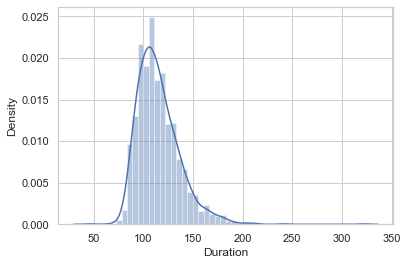

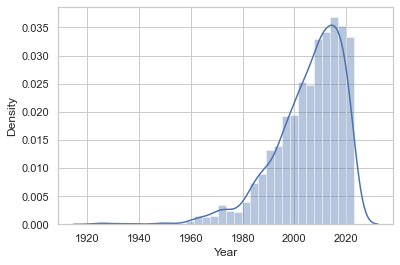

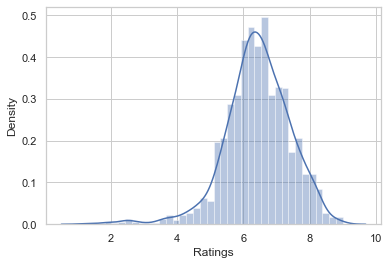

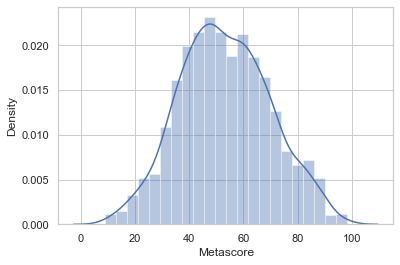

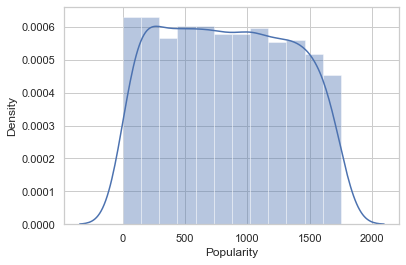

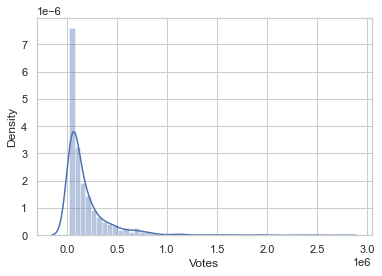

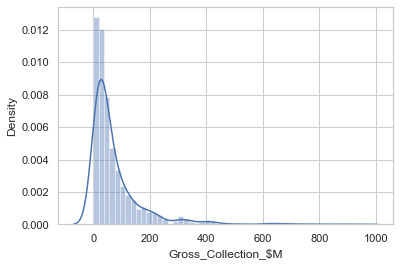

In [30]:
# Check Normality of continous data
for i in num.columns:
    sns.distplot(num[i])
    plt.show()

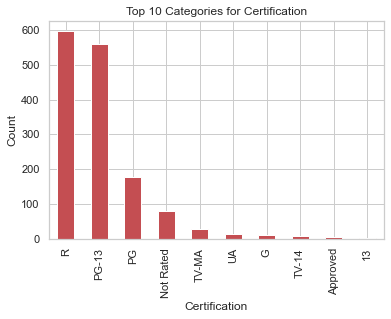

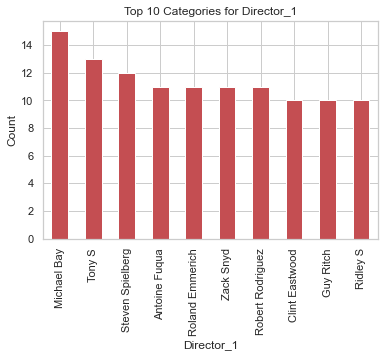

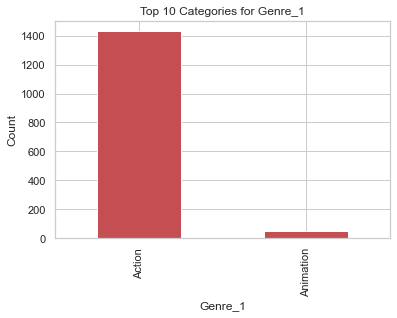

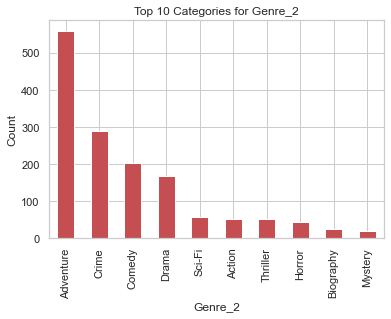

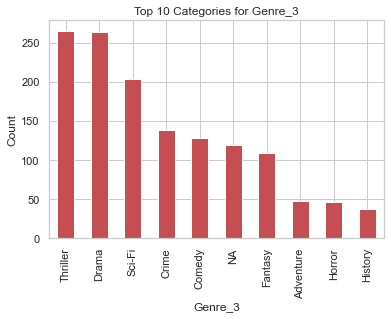

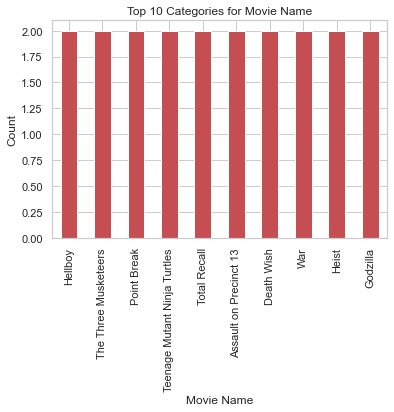

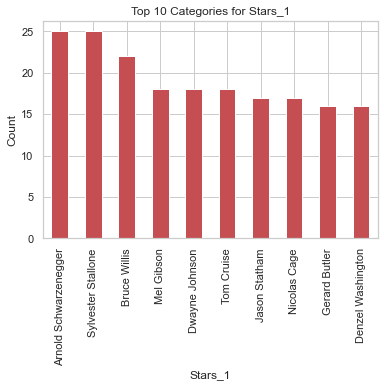

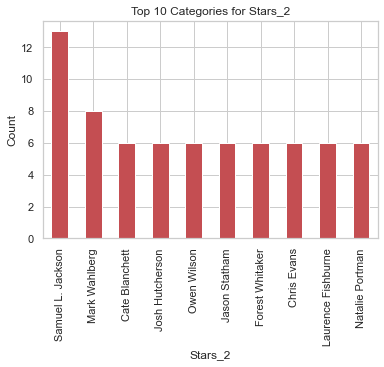

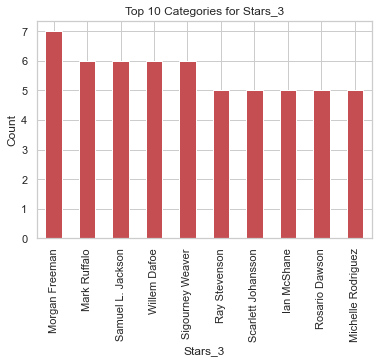

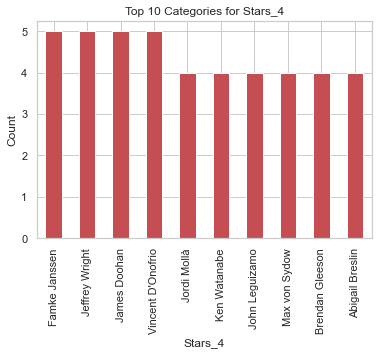

In [31]:
# Check count of categorical data for the best 7
for i in cat.columns.difference(['Director_2','Director_3']):
    cat[i].value_counts().sort_values(ascending=False).head(10).plot(kind='bar', color='r')
    plt.xlabel(i)
    plt.ylabel('Count')
    plt.title(f'Top 10 Categories for {i}')
    plt.show()

#### Bivariate analysis

In [32]:
# top 20 rated movies according to  Popularity|User Rating|Number of Votes/Metascore/Runtime
for col in ['Popularity','Ratings','Votes','Metascore','Duration','Gross_Collection_$M']:
    top_rated= df.sort_values(by=col ,ascending=False).head(20)
    figure=px.bar(top_rated,x='Movie Name',y=col)
    figure.show()

------------------------------------------------------------------------------------------------------------------------------

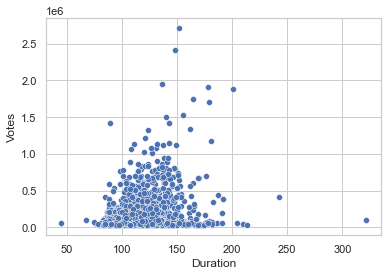

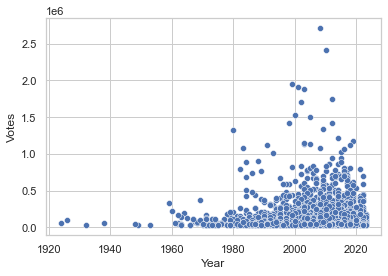

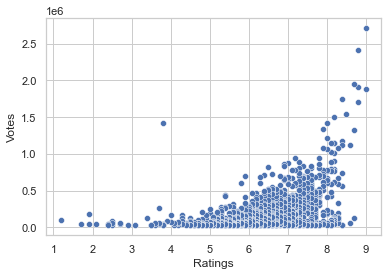

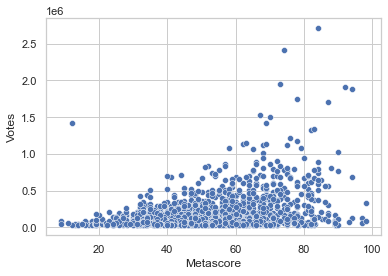

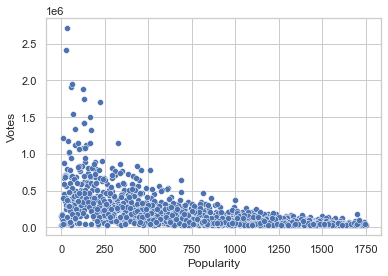

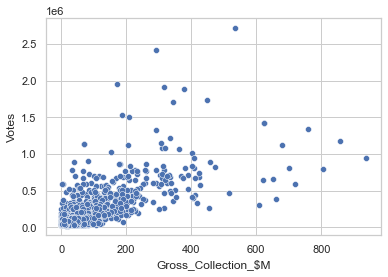

In [33]:
# Scatter plot between continous features and target variable (Votes) 
for i in num.columns.drop(['Votes']):
    sns.scatterplot(x=i, y='Votes', data=num)
    plt.show()

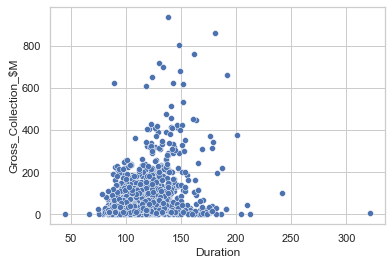

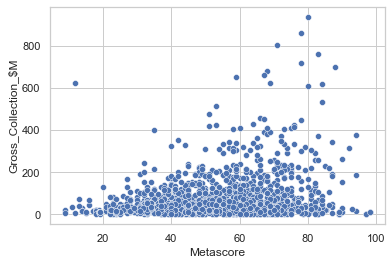

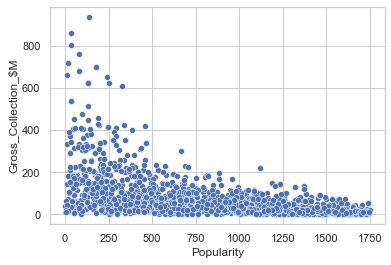

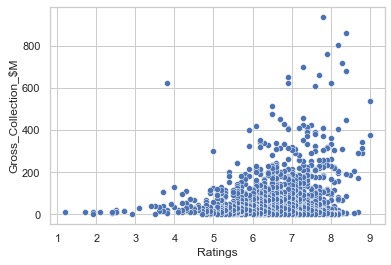

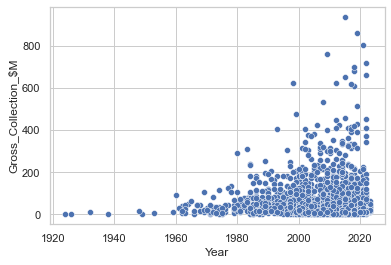

In [34]:
# Scatter plot between continous features and target variable (Votes) 
for i in num.columns.difference(['Votes','Gross_Collection_$M']):
    sns.scatterplot(x=i, y='Gross_Collection_$M', data=num)
    plt.show()

In [35]:
# Checking the relation between year and  Targets variables

# Sort the DataFrame by the x-axis column in ascending order
df_sorted = df.sort_values(by='Year')

# Create the plotly bar plot
fig = px.line(df_sorted, x='Year', y='Votes',width=1500, height=600)

# Display the plot
fig.show()

In [36]:
# Sort the DataFrame by the x-axis column in ascending order
df_sorted = df.sort_values(by='Year')

# Create the plotly bar plot
fig = px.line(df_sorted, x='Year', y='Gross_Collection_$M',width=1500, height=600)

# Display the plot
fig.show()

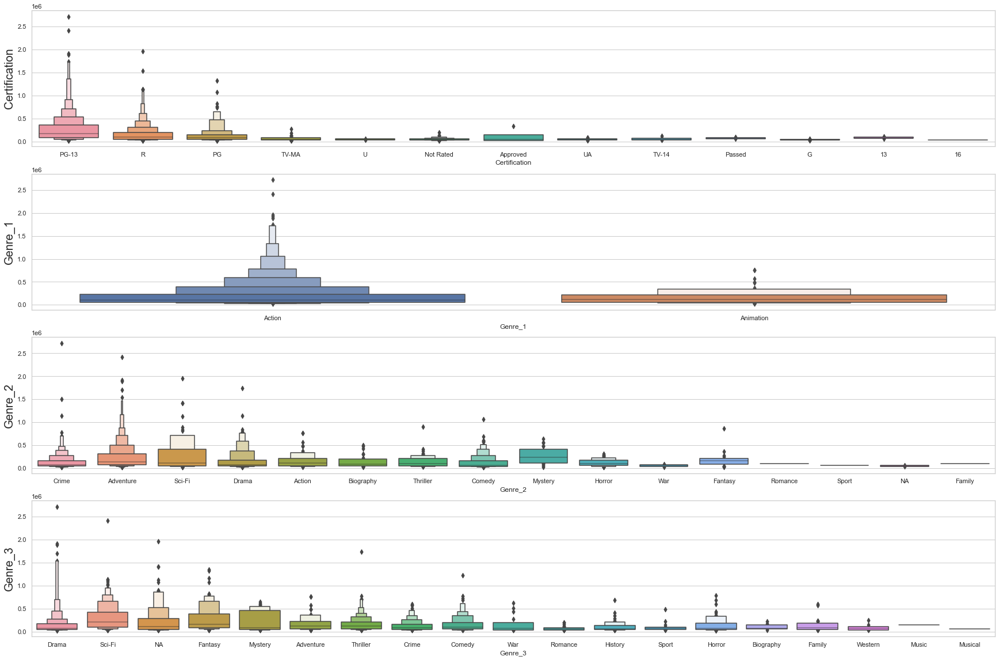

In [37]:
# Relationship between categorical columns and Target variable (Votes)

plt.figure(figsize=(30,20), facecolor='white')
plotnumber = 1

for i in ['Certification', 'Genre_1', 'Genre_2','Genre_3']:
    if plotnumber<=4 :
        ax = plt.subplot(4,1,plotnumber)
        sns.boxenplot(y=df.Votes,x=df[i])
        plt.ylabel(i,fontsize=20)
       
    plotnumber+=1
plt.show()

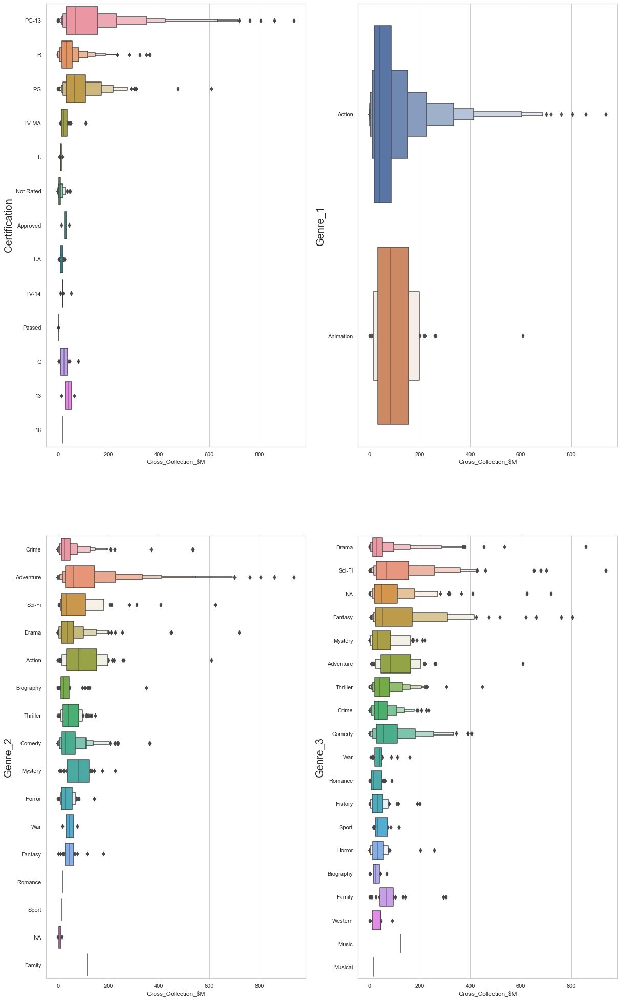

In [38]:
# Relationship between categorical columns and Target variable (Gross)

plt.figure(figsize=(20,35), facecolor='white')
plotnumber = 1

for i in ['Certification', 'Genre_1', 'Genre_2','Genre_3']:
    if plotnumber<=4 :
        ax = plt.subplot(2,2,plotnumber)
        sns.boxenplot(x=df['Gross_Collection_$M'],y=df[i])
        plt.ylabel(i,fontsize=20)
       
    plotnumber+=1
plt.show()

#### Multivariate analysis

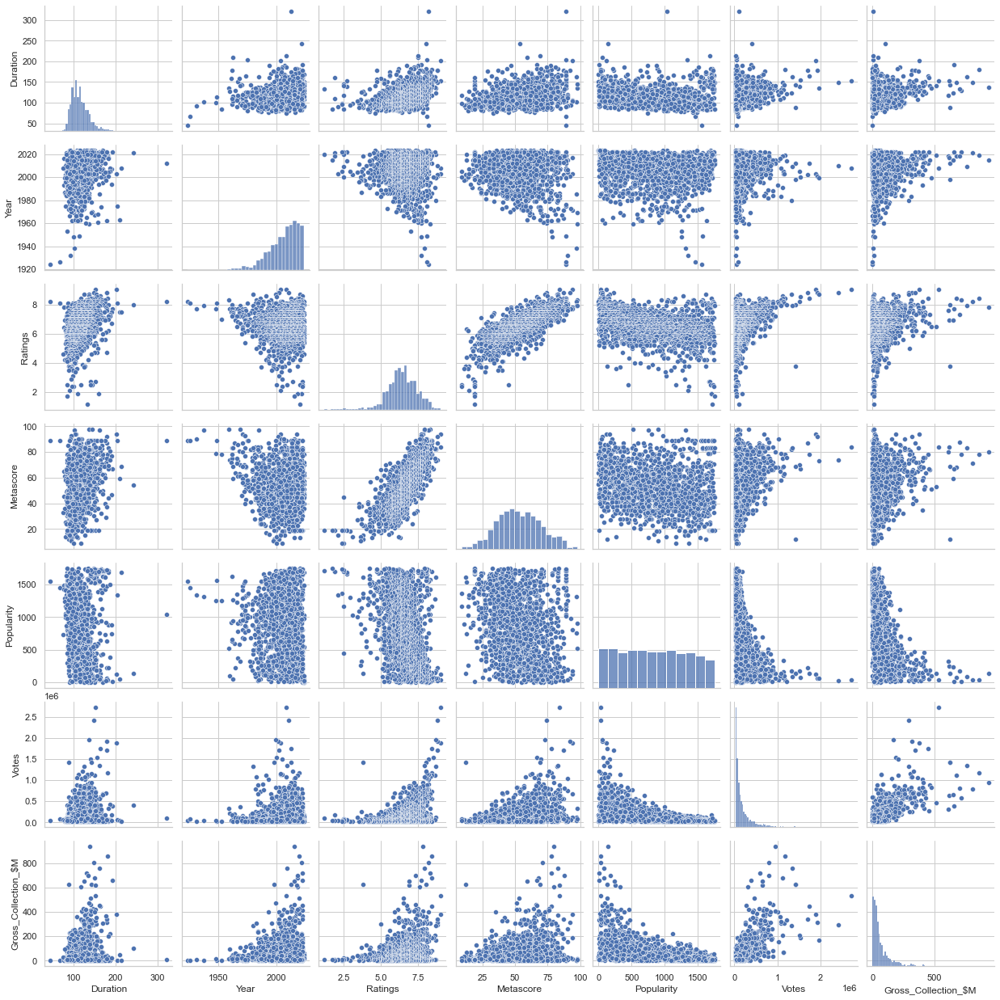

In [39]:
# Observe the Comparison between variables?

sns.pairplot(df)
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### we will have two Dataframes one for predicting Votes and one for Gross_Collection_M.

------------------------------------------------------------------------------------------------------------------------------

#### Feature Extraction

In [40]:
# Create new feature to show movies year released from 2023
df['Year_from_2023']=  2023 - df['Year'] 
df_gross['Year_from_2023']= 2023 - df_gross['Year'] 

In [41]:
# Drop year feature not needed anymore.
df.drop('Year', axis=1,inplace=True)
df_gross.drop('Year', axis=1,inplace=True)

In [42]:
df.columns

Index(['Movie Name', 'Director_1', 'Director_2', 'Director_3', 'Duration', 'Ratings', 'Metascore',
       'Popularity', 'Stars_1', 'Stars_2', 'Stars_3', 'Stars_4', 'Votes', 'Genre_1', 'Genre_2',
       'Genre_3', 'Gross_Collection_$M', 'Certification', 'Year_from_2023'],
      dtype='object')

### Outliers treatment 

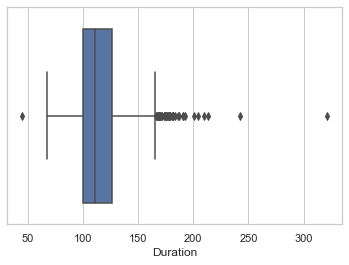

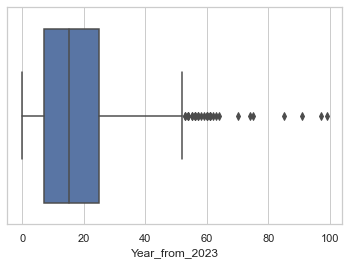

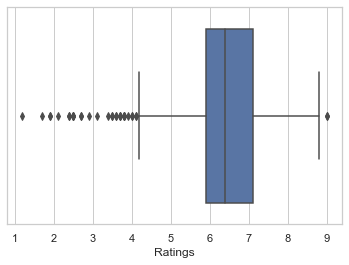

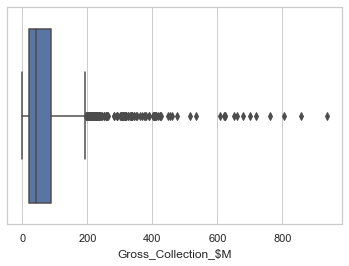

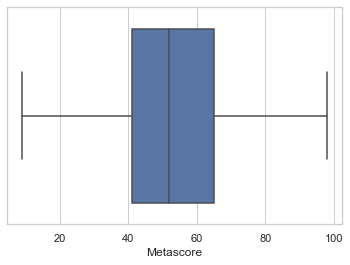

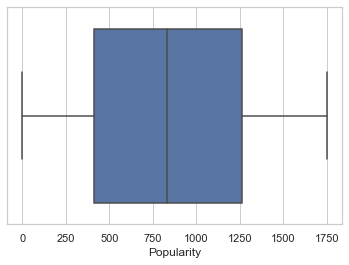

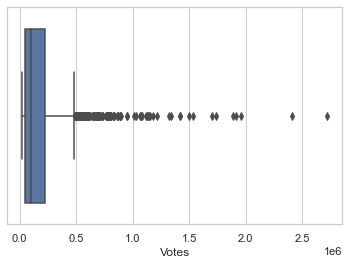

In [43]:
# Check outliers using boxplot
for col in ['Duration', 'Year_from_2023', 'Ratings','Gross_Collection_$M','Metascore', 'Popularity','Votes']:
    sns.boxplot(df[col])
    plt.show()

In [44]:
# use Z-score method
outliers=df[['Duration', 'Year_from_2023', 'Ratings','Gross_Collection_$M','Metascore', 'Popularity','Votes']]
z=np.abs(zscore(outliers))
df_new=df[(z<3).all(axis=1)]
df_new

,Movie Name,Director_1,Director_2,Director_3,Duration,Ratings,Metascore,Popularity,Stars_1,Stars_2,Stars_3,Stars_4,Votes,Genre_1,Genre_2,Genre_3,Gross_Collection_$M,Certification,Year_from_2023
7,Soorarai Pottru,Sudha Kongara,NA,NA,153,8.7,82.6,1612,Suriya,Paresh Rawal,Aparna Balamurali,Urvashi,119509,Action,Drama,NA,9.502,TV-MA,3
9,Sita Ramam,Hanu Raghavapud,NA,NA,163,8.6,82.6,1272,Dulquer Salmaan,Mrunal Thakur,Rashmika Mandanna,Sumanth,59938,Action,Drama,Mystery,6.400,U,1
12,Spider-Man: Into the Spider-Verse,Bob Persich,Peter Ramsey,Rodney Rothman,117,8.4,87.0,27,Shameik Moore,Jake Johnson,Hailee Steinfeld,Mahershala Ali,566844,Animation,Action,Adventure,190.240,PG,5
15,Aliens,James Cameron,NA,NA,137,8.4,84.0,154,Sigourney Weaver,Michael Biehn,Carrie Henn,Paul Reiser,732615,Action,Adventure,Sci-Fi,85.160,R,37
16,Kaithi,Lokesh Kanagaraj,NA,NA,145,8.4,89.0,1159,Karthi,Narain,Arjun Das,George Maryan,36110,Action,Adventure,Crime,6.400,Not Rated,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1464,Superman IV: The Quest for Peace,Sidney J. Fu,NA,NA,90,3.7,24.0,1145,Christopher Reeve,Gene Hackman,Margot Kidder,Jackie Cooper,50631,Action,Adventure,Sci-Fi,15.680,PG,36
1465,Dungeons & Dragons,Courtney Solomon,NA,NA,107,3.6,14.0,265,Justin Whalin,Jeremy Irons,Zoe McLellan,Bruce Payne,35146,Action,Adventure,Fantasy,15.220,PG-13,23
1466,Mortal Kombat: Annihilation,John R. Leon,NA,NA,95,3.6,11.0,896,Robin Shou,Talisa Soto,James Remar,Sandra Hess,56377,Action,Adventure,Fantasy,35.930,PG-13,26
1467,Barb Wire,avid Hogan,NA,NA,98,3.5,40.0,1095,Pamela Anderson,Amir AboulEla,Adriana Alexander,David Andriole,30260,Action,Sci-Fi,NA,3.790,R,27


In [45]:
# data loss percentage

loss_percentage= ((df.shape[0]- df_new.shape[0])/df.shape[0])*100
loss_percentage

6.536388140161725

##### It's acceptable.

In [46]:
# Check Skewness
df_new.skew()

Duration               0.809264
Ratings               -0.256305
Metascore              0.172465
Popularity             0.032878
Votes                  1.901853
Gross_Collection_$M    1.905276
Year_from_2023         0.876565
dtype: float64

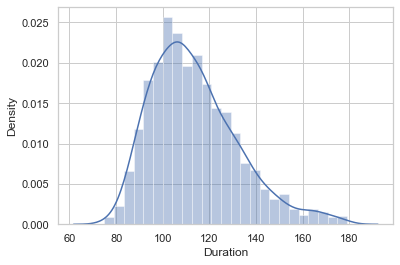

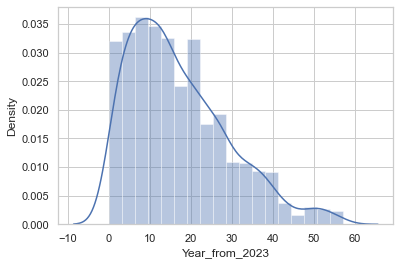

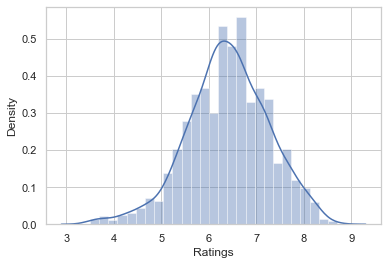

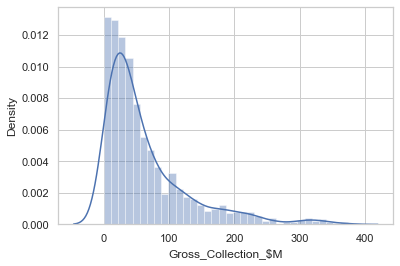

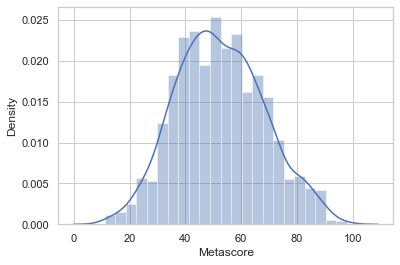

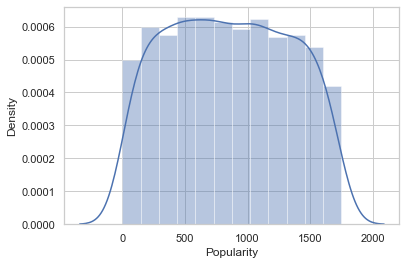

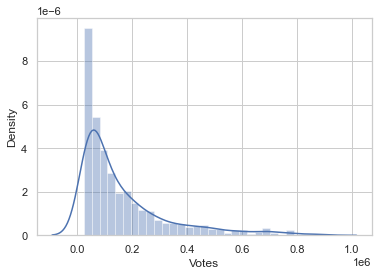

In [47]:
# Check Normality now
for i in ['Duration', 'Year_from_2023', 'Ratings','Gross_Collection_$M','Metascore', 'Popularity','Votes']:
    sns.distplot(df_new[i])
    plt.show()

In [48]:
# Sort columns by datatypes
df_new.columns.to_series().groupby(df_new.dtypes).groups

{int64: ['Duration', 'Popularity', 'Votes', 'Year_from_2023'], float64: ['Ratings', 'Metascore', 'Gross_Collection_$M'], object: ['Movie Name', 'Director_1', 'Director_2', 'Director_3', 'Stars_1', 'Stars_2', 'Stars_3', 'Stars_4', 'Genre_1', 'Genre_2', 'Genre_3', 'Certification']}

In [49]:
# I'll consider -0.3/0.3 is ok among features skewness and treat the others features.
# suchas: Gangs of Wasseypur movie both parts originally shot as a single film measuring a total=321 minutes & screened @ 2012
# URL: https://en.wikipedia.org/wiki/Gangs_of_Wasseypur

skew_cols=['Votes','Gross_Collection_$M','Duration','Year_from_2023']

In [50]:
# withing Power transformer to treat skewness
scaler = PowerTransformer()
df_new[skew_cols] = scaler.fit_transform(df_new[skew_cols].values)

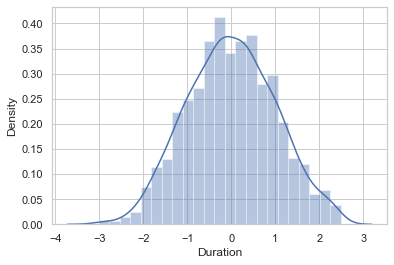

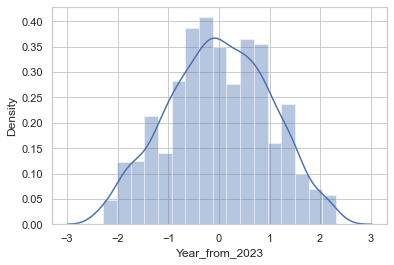

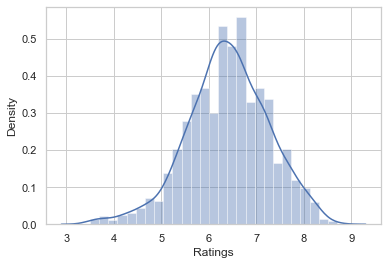

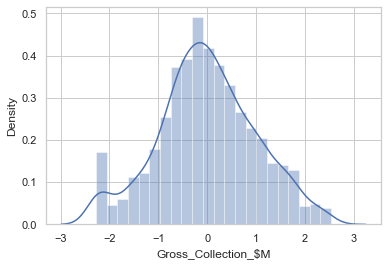

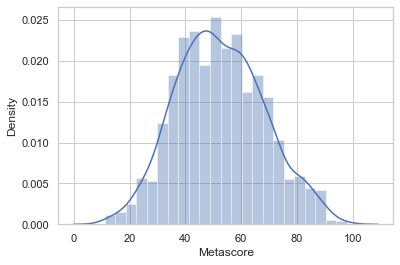

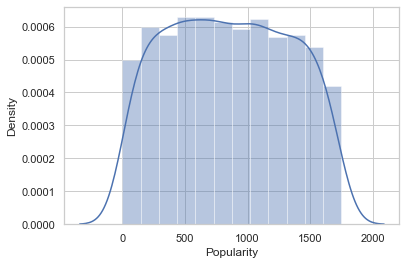

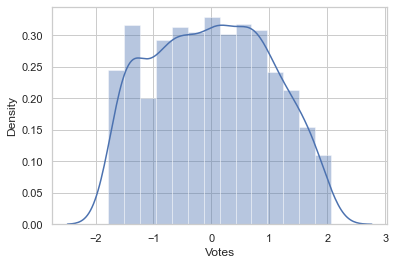

In [51]:
# Check Normality now
for i in ['Duration', 'Year_from_2023', 'Ratings','Gross_Collection_$M','Metascore', 'Popularity','Votes']:
    sns.distplot(df_new[i])
    plt.show()

In [52]:
# Check Skewness
df_new.skew()

Duration               0.019140
Ratings               -0.256305
Metascore              0.172465
Popularity             0.032878
Votes                  0.053879
Gross_Collection_$M   -0.017235
Year_from_2023        -0.063755
dtype: float64

In [53]:
# drop unnecessary columns
df_new.drop(columns=['Movie Name'],axis=1,inplace=True)

###### Encoding

In [54]:
# Use getdummies and frequency for large  for nominal features 
    
df_new=pd.get_dummies(df_new,columns=['Genre_1','Genre_2','Genre_3','Certification'],drop_first=True)

In [55]:
# Calculate the frequency of each category

for i in ['Director_1','Stars_1', 'Stars_2','Stars_3', 'Stars_4','Director_2','Director_3']:
    frequency = df_new[i].value_counts(normalize=True)
    # Create a new column with the frequency encoding
    df_new[i] = df_new[i].map(frequency)

# Display the DataFrame with the frequency encoded columns
df_new

,Director_1,Director_2,Director_3,Duration,Ratings,Metascore,Popularity,Stars_1,Stars_2,Stars_3,Stars_4,Votes,Gross_Collection_$M,Year_from_2023,Genre_1_Animation,Genre_2_Adventure,Genre_2_Biography,Genre_2_Comedy,Genre_2_Crime,Genre_2_Drama,Genre_2_Family,Genre_2_Fantasy,Genre_2_Horror,Genre_2_Mystery,Genre_2_NA,Genre_2_Romance,Genre_2_Sci-Fi,Genre_2_Sport,Genre_2_Thriller,Genre_2_War,Genre_3_Biography,Genre_3_Comedy,Genre_3_Crime,Genre_3_Drama,Genre_3_Family,Genre_3_Fantasy,Genre_3_History,Genre_3_Horror,Genre_3_Music,Genre_3_Mystery,Genre_3_NA,Genre_3_Romance,Genre_3_Sci-Fi,Genre_3_Sport,Genre_3_Thriller,Genre_3_War,Genre_3_Western,Certification_16,Certification_Approved,Certification_G,Certification_Not Rated,Certification_PG,Certification_PG-13,Certification_R,Certification_TV-14,Certification_TV-MA,Certification_U,Certification_UA
7,0.000721,0.946647,0.997116,1.793010,8.7,82.6,1612,0.000721,0.001442,0.000721,0.000721,0.194055,-1.091170,-1.416054,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
9,0.000721,0.946647,0.997116,2.085830,8.6,82.6,1272,0.000721,0.001442,0.001442,0.000721,-0.610647,-1.310922,-1.906185,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
12,0.000721,0.000721,0.000721,0.341696,8.4,87.0,27,0.000721,0.000721,0.001442,0.001442,1.689793,1.609994,-1.063499,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
15,0.002163,0.946647,0.997116,1.238912,8.4,84.0,154,0.001442,0.000721,0.000721,0.000721,1.899580,0.679802,1.445927,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
16,0.001442,0.946647,0.997116,1.530720,8.4,89.0,1159,0.000721,0.000721,0.000721,0.000721,-1.266427,-1.310922,-1.228761,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1464,0.000721,0.946647,0.997116,-1.473647,3.7,24.0,1145,0.002163,0.003605,0.002163,0.001442,-0.822616,-0.772120,1.395744,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1465,0.000721,0.946647,0.997116,-0.227676,3.6,14.0,265,0.000721,0.001442,0.000721,0.000721,-1.303103,-0.792388,0.648428,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1466,0.000721,0.946647,0.997116,-1.062676,3.6,11.0,896,0.000721,0.000721,0.001442,0.000721,-0.686864,-0.137735,0.839763,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1467,0.000721,0.946647,0.997116,-0.835485,3.5,40.0,1095,0.000721,0.000721,0.000721,0.000721,-1.509140,-1.560315,0.900592,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


-------------------------------------------------------------------------------------------------------------------------------

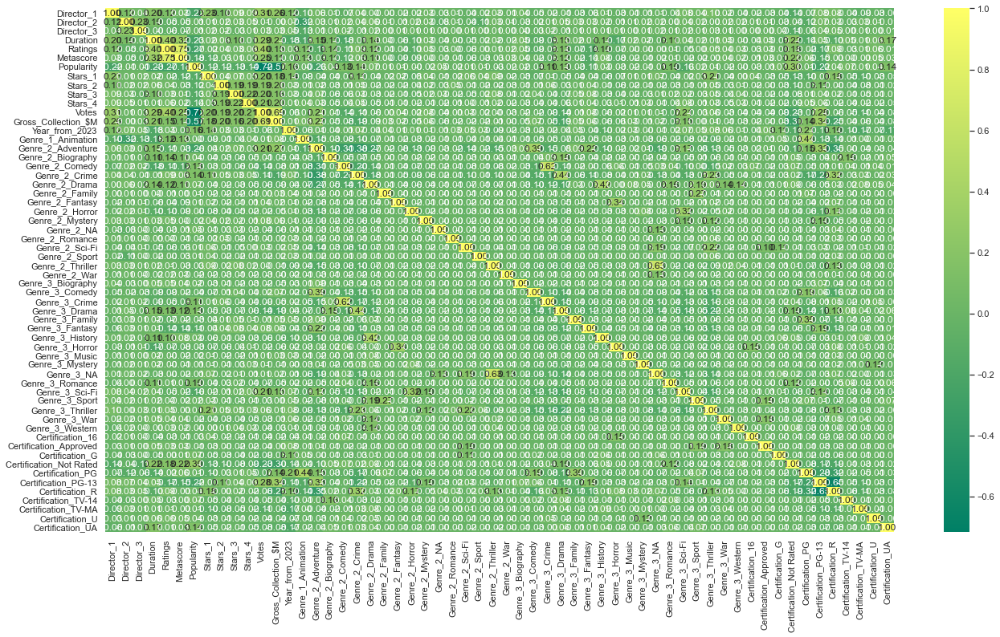

In [56]:
# heatmap correlation
plt.figure(figsize = (22,12))
sns.heatmap(df_new.corr(), annot=True,cmap='summer',fmt='.2f')
plt.show()

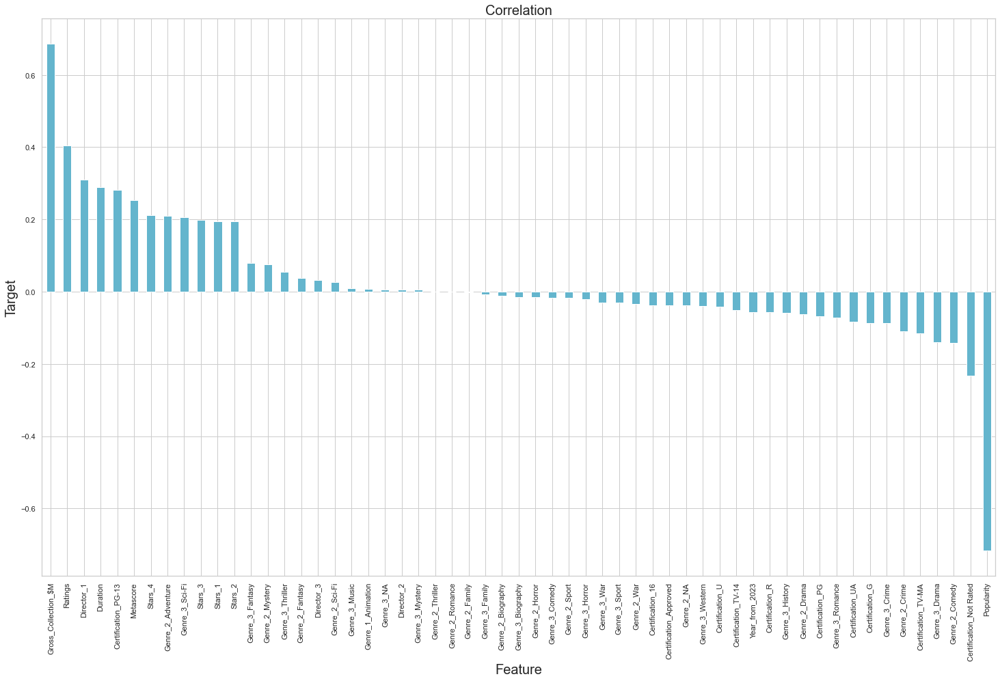

In [57]:
#Visualization of the Correlation Metrics for using Votes as target feature
plt.figure(figsize = (25, 15))

df_new.corr()['Votes'].sort_values(ascending = False).drop(['Votes']).plot(kind = 'bar', color = 'c')

plt.xlabel('Feature', fontsize = 20)

plt.ylabel('Target', fontsize = 20)

plt.title('Correlation', fontsize = 20)

plt.show()

Gross_Millions is strong postive correlation withe the target.

Mystery,Thirler , Romance and Family in Genre_2 is almost zero correlation.

Popularity is strong negative correlation with the target.

------------------------------------------------------------------------------------------------------------------------------

### DF_gross

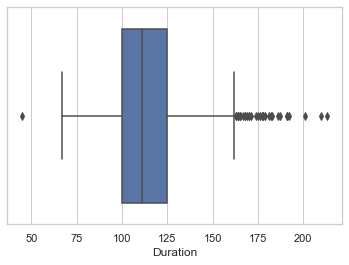

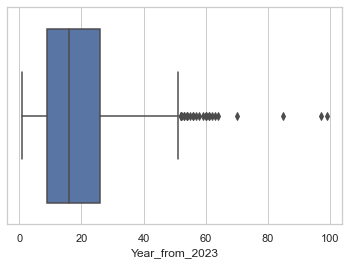

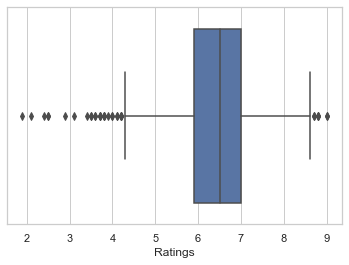

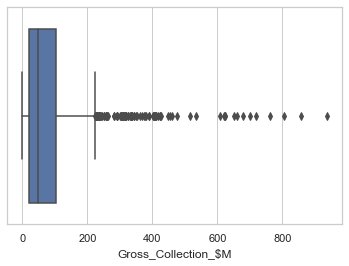

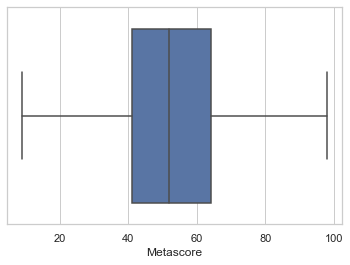

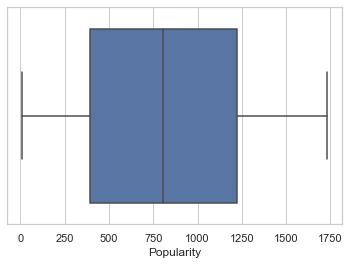

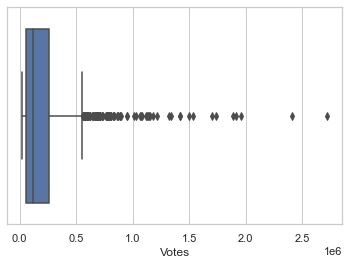

In [58]:
# Check outliers using boxplot
for col in ['Duration', 'Year_from_2023', 'Ratings','Gross_Collection_$M','Metascore', 'Popularity','Votes']:
    sns.boxplot(df_gross[col])
    plt.show()

In [59]:
# use Z-score method
outliers=df_gross[['Duration', 'Year_from_2023', 'Ratings','Gross_Collection_$M','Metascore', 'Popularity','Votes']]
z=np.abs(zscore(outliers))
dfgross_new=df_gross[(z<3).all(axis=1)]
dfgross_new

,Movie Name,Director_1,Director_2,Director_3,Duration,Ratings,Metascore,Popularity,Stars_1,Stars_2,Stars_3,Stars_4,Votes,Genre_1,Genre_2,Genre_3,Gross_Collection_$M,Certification,Year_from_2023
12,Spider-Man: Into the Spider-Verse,Bob Persich,Peter Ramsey,Rodney Rothman,117,8.4,87.0,27,Shameik Moore,Jake Johnson,Hailee Steinfeld,Mahershala Ali,566844,Animation,Action,Adventure,190.24,PG,5
15,Aliens,James Cameron,NA,NA,137,8.4,84.0,154,Sigourney Weaver,Michael Biehn,Carrie Henn,Paul Reiser,732615,Action,Adventure,Sci-Fi,85.16,R,37
18,Heat,Michael Mann,NA,NA,170,8.3,76.0,18,Al Pacino,Robert De Niro,Val Kilmer,Jon Voight,676362,Action,Crime,Drama,67.44,R,28
23,Dangal,Nitesh Tiwa,NA,NA,161,8.3,80.4,1045,Aamir Khan,Sakshi Tanwar,Fatima Sana Shaikh,Sanya Malhotra,197349,Action,Biography,Drama,12.39,Not Rated,7
24,K.G.F: Chapter 2,Prashanth Neel,NA,NA,168,8.3,82.6,1427,Yash,Sanjay Dutt,Raveena Tandon,Srinidhi Shetty,139647,Action,Crime,Drama,6.60,Not Rated,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1459,In the Name of the King: A Dungeon Siege Tale,Uwe Boll,NA,NA,127,3.8,15.0,1295,Jason Statham,Ron Perlman,Ray Liotta,Leelee Sobieski,50115,Action,Adventure,Fantasy,4.54,PG-13,16
1461,The Adventures of Pluto Nash,Ron Underwood,NA,NA,95,3.8,12.0,1611,Eddie Murphy,Jay Mohr,Randy Quaid,Rosario Dawson,26458,Action,Comedy,Sci-Fi,4.42,PG-13,21
1462,Batman & Robin,Joel Schumach,NA,NA,125,3.7,28.0,321,Arnold Schwarzenegger,George Clooney,Chris O'Donnell,Uma Thurman,259632,Action,Sci-Fi,NA,107.33,PG-13,26
1463,The Adventures of Sharkboy and Lavagirl 3-D,Robert Rodriguez,NA,NA,93,3.7,38.0,757,Cayden Boyd,George Lopez,Kristin Davis,David Arquette,39948,Action,Adventure,Comedy,39.18,PG,18


In [60]:
# data loss percentage

loss_percentage= ((df_gross.shape[0]- dfgross_new.shape[0])/df_gross.shape[0])*100
loss_percentage

6.708268330733229

##### It's acceptable.

In [61]:
# Check Skewness
dfgross_new.skew()

Duration               0.643406
Ratings               -0.286922
Metascore              0.168419
Popularity             0.043045
Votes                  1.738299
Gross_Collection_$M    1.787483
Year_from_2023         0.821113
dtype: float64

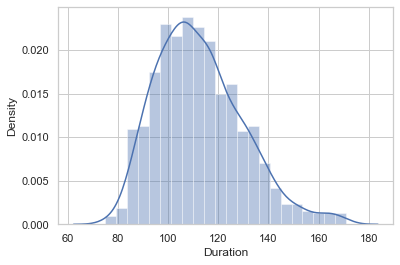

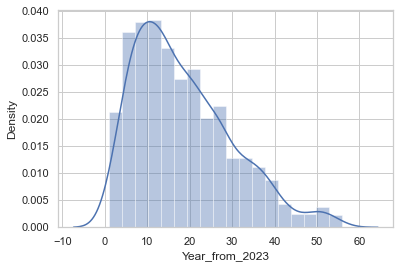

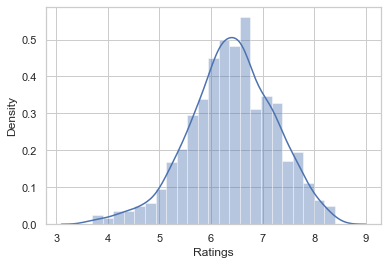

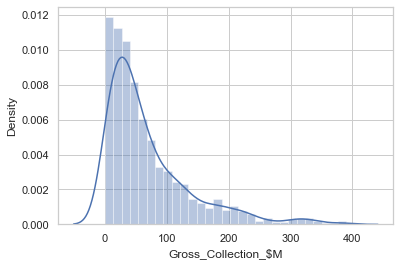

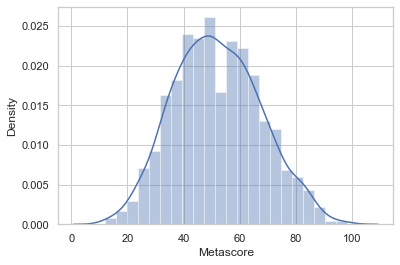

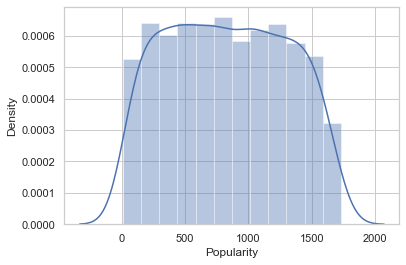

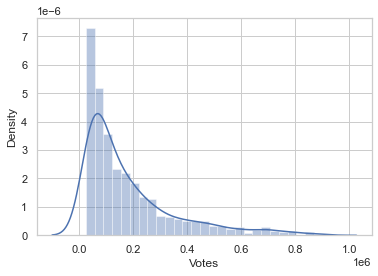

In [62]:
# Check Normality now
for i in ['Duration', 'Year_from_2023', 'Ratings','Gross_Collection_$M','Metascore', 'Popularity','Votes']:
    sns.distplot(dfgross_new[i])
    plt.show()

In [63]:
# I'll consider -0.7/0.7 is ok among features skewness and treat the others features.
skew_cols=['Votes','Gross_Collection_$M','Duration','Year_from_2023']

In [64]:
# withing Power transformer to treat skewness
scaler = PowerTransformer()
dfgross_new[skew_cols] = scaler.fit_transform(dfgross_new[skew_cols].values)

In [65]:
# drop unnecessary columns
dfgross_new.drop(columns=['Movie Name'],axis=1,inplace=True)

###### Encoding

In [66]:
# Use getdummies for nominal features 
    
dfgross_new=pd.get_dummies(dfgross_new,columns=['Genre_1','Genre_2','Genre_3','Certification'],drop_first=True)

In [67]:
# Calculate the frequency of each category

for i in ['Director_1','Stars_1', 'Year_from_2023','Stars_2','Stars_3','Stars_4','Director_2','Director_3']:
    frequency = dfgross_new[i].value_counts(normalize=True)
    # Create a new column with the frequency encoding
    dfgross_new[i] = dfgross_new[i].map(frequency)

# Display the DataFrame with the frequency encoded columns
dfgross_new

,Director_1,Director_2,Director_3,Duration,Ratings,Metascore,Popularity,Stars_1,Stars_2,Stars_3,Stars_4,Votes,Gross_Collection_$M,Year_from_2023,Genre_1_Animation,Genre_2_Adventure,Genre_2_Biography,Genre_2_Comedy,Genre_2_Crime,Genre_2_Drama,Genre_2_Family,Genre_2_Fantasy,Genre_2_Horror,Genre_2_Mystery,Genre_2_NA,Genre_2_Romance,Genre_2_Sci-Fi,Genre_2_Sport,Genre_2_Thriller,Genre_2_War,Genre_3_Biography,Genre_3_Comedy,Genre_3_Crime,Genre_3_Drama,Genre_3_Family,Genre_3_Fantasy,Genre_3_History,Genre_3_Horror,Genre_3_Music,Genre_3_Mystery,Genre_3_NA,Genre_3_Romance,Genre_3_Sci-Fi,Genre_3_Sport,Genre_3_Thriller,Genre_3_War,Genre_3_Western,Certification_Approved,Certification_G,Certification_Not Rated,Certification_PG,Certification_PG-13,Certification_R
12,0.000836,0.000836,0.000836,0.378732,8.4,87.0,27,0.000836,0.000836,0.001672,0.001672,1.644313,1.504876,0.034281,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
15,0.002508,0.948997,0.997492,1.352127,8.4,84.0,154,0.001672,0.000836,0.000836,0.000836,1.885040,0.566747,0.011706,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
18,0.005853,0.948997,0.997492,2.534333,8.3,76.0,18,0.001672,0.000836,0.001672,0.001672,1.810774,0.330731,0.022575,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
23,0.000836,0.948997,0.997492,2.251552,8.3,80.4,1045,0.001672,0.000836,0.000836,0.000836,0.582249,-0.985941,0.044314,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
24,0.000836,0.948997,0.997492,2.473643,8.3,82.6,1427,0.000836,0.000836,0.000836,0.000836,0.207390,-1.325198,0.012542,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1459,0.000836,0.948997,0.997492,0.896798,3.8,15.0,1295,0.012542,0.002508,0.001672,0.000836,-0.987759,-1.493566,0.026756,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1461,0.001672,0.948997,0.997492,-1.064901,3.8,12.0,1611,0.007525,0.000836,0.001672,0.001672,-1.801277,-1.504714,0.026756,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
1462,0.003344,0.948997,0.997492,0.798626,3.7,28.0,321,0.020067,0.001672,0.000836,0.000836,0.869901,0.816187,0.026756,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
1463,0.007525,0.948997,0.997492,-1.223368,3.7,38.0,757,0.000836,0.000836,0.000836,0.000836,-1.270236,-0.163038,0.027592,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


------------------------------------------------------------------------------------------------------------------------------

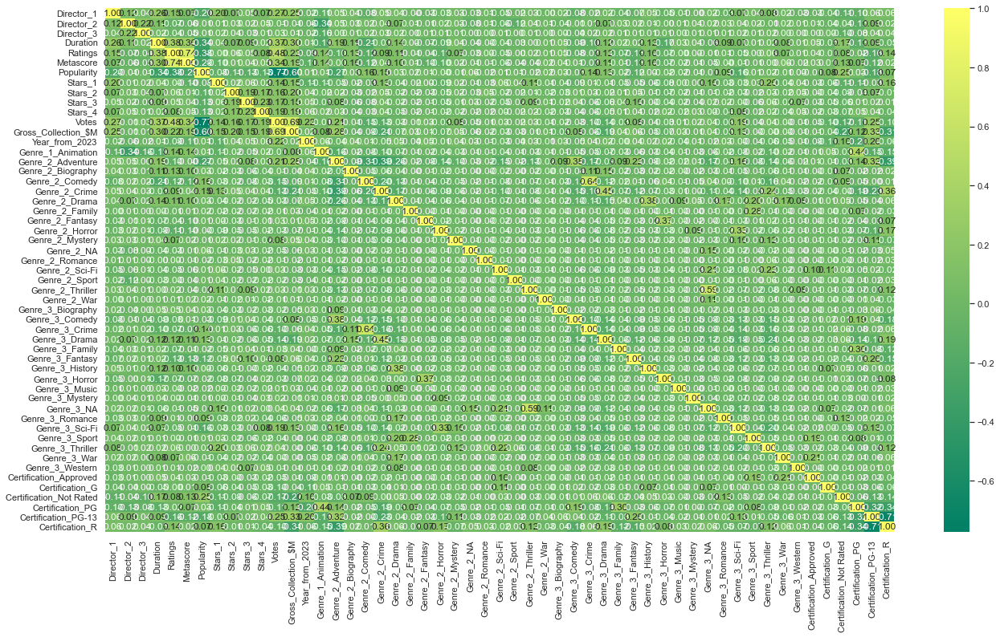

In [68]:
# heatmap correlation
plt.figure(figsize = (22,12))
sns.heatmap(dfgross_new.corr(), annot=True,cmap='summer',fmt='.2f')
plt.show()

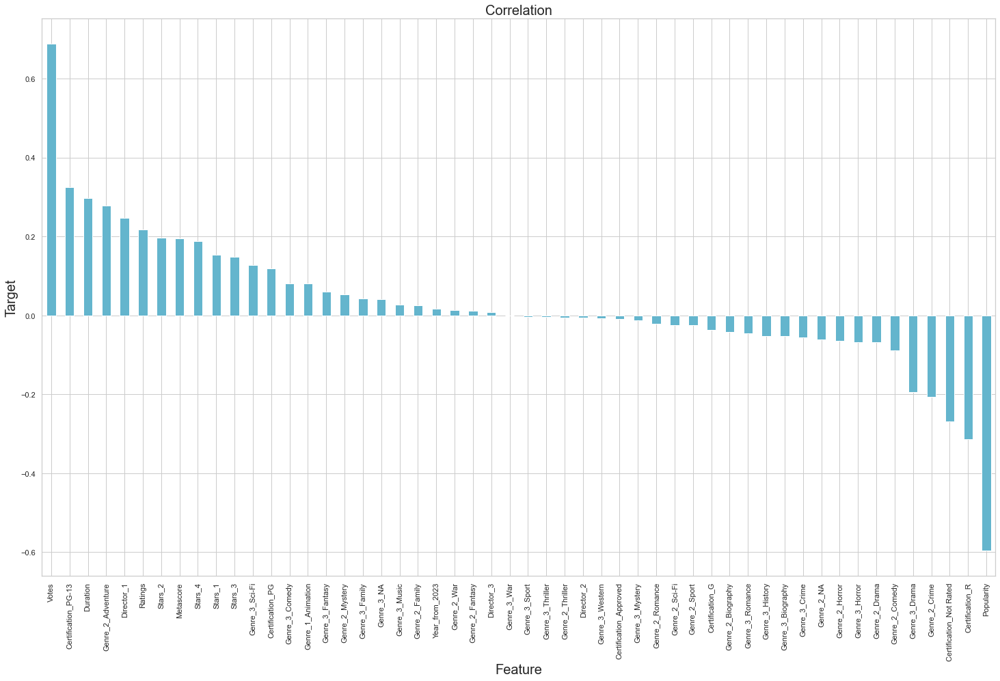

In [69]:
#Visualization of the Correlation Metrics for using Votes as target feature
plt.figure(figsize = (25, 15))

dfgross_new.corr()['Gross_Collection_$M'].sort_values(ascending = False).drop(['Gross_Collection_$M']).plot(kind = 'bar', color = 'c')

plt.xlabel('Feature', fontsize = 20)

plt.ylabel('Target', fontsize = 20)

plt.title('Correlation', fontsize = 20)

plt.show()

Votes is strong postive correlation withe the target.

war , sport Thriller in Genre_3 Genre_2_Thriller is the least correlation with the target.

Popularity is strong  negative correlation with the target.

------------------------------------------------------------------------------------------------------------------------------

------------------------------------------------------------------------------------------------------------------------------

## Regression Problem (Votes)

In [70]:
# Votes is the target feature now.
x = df_new.drop('Votes',axis=1)
y = df_new['Votes']

### Standarization

In [71]:
sc= StandardScaler()
x = pd.DataFrame(sc.fit_transform(x), columns = x.columns)
x

,Director_1,Director_2,Director_3,Duration,Ratings,Metascore,Popularity,Stars_1,Stars_2,Stars_3,Stars_4,Gross_Collection_$M,Year_from_2023,Genre_1_Animation,Genre_2_Adventure,Genre_2_Biography,Genre_2_Comedy,Genre_2_Crime,Genre_2_Drama,Genre_2_Family,Genre_2_Fantasy,Genre_2_Horror,Genre_2_Mystery,Genre_2_NA,Genre_2_Romance,Genre_2_Sci-Fi,Genre_2_Sport,Genre_2_Thriller,Genre_2_War,Genre_3_Biography,Genre_3_Comedy,Genre_3_Crime,Genre_3_Drama,Genre_3_Family,Genre_3_Fantasy,Genre_3_History,Genre_3_Horror,Genre_3_Music,Genre_3_Mystery,Genre_3_NA,Genre_3_Romance,Genre_3_Sci-Fi,Genre_3_Sport,Genre_3_Thriller,Genre_3_War,Genre_3_Western,Certification_16,Certification_Approved,Certification_G,Certification_Not Rated,Certification_PG,Certification_PG-13,Certification_R,Certification_TV-14,Certification_TV-MA,Certification_U,Certification_UA
0,-0.783469,0.237401,0.053780,1.793010,2.685545,1.911754,1.563151,-0.851133,-0.072670,-0.649370,-0.547103,-1.091170,-1.416054,-0.193383,-0.753148,-0.132696,-0.405669,-0.501802,2.819288,-0.026861,-0.104561,-0.17453,-0.117851,-0.038001,-0.026861,-0.189335,-0.026861,-0.195381,-0.038001,-0.071221,-0.309155,-0.329717,-0.465475,-0.123989,-0.268086,-0.158522,-0.178869,-0.026861,-0.158522,3.390501,-0.117851,-0.391089,-0.100978,-0.47348,-0.104561,-0.071221,-0.026861,-0.038001,-0.065914,-0.223522,-0.369980,-0.768503,-0.851542,-0.065914,7.536025,-0.038001,-0.09342
1,-0.783469,0.237401,0.053780,2.085830,2.568555,1.911754,0.860305,-0.851133,-0.072670,0.275349,-0.547103,-1.310922,-1.906185,-0.193383,-0.753148,-0.132696,-0.405669,-0.501802,2.819288,-0.026861,-0.104561,-0.17453,-0.117851,-0.038001,-0.026861,-0.189335,-0.026861,-0.195381,-0.038001,-0.071221,-0.309155,-0.329717,-0.465475,-0.123989,-0.268086,-0.158522,-0.178869,-0.026861,6.308258,-0.294942,-0.117851,-0.391089,-0.100978,-0.47348,-0.104561,-0.071221,-0.026861,-0.038001,-0.065914,-0.223522,-0.369980,-0.768503,-0.851542,-0.065914,-0.132696,26.315395,-0.09342
2,-0.783469,-4.214197,-18.594354,0.341696,2.334574,2.191013,-1.713350,-0.851133,-0.714664,0.275349,0.649793,1.609994,-1.063499,5.171073,-0.753148,-0.132696,-0.405669,-0.501802,-0.354699,-0.026861,-0.104561,-0.17453,-0.117851,-0.038001,-0.026861,-0.189335,-0.026861,-0.195381,-0.038001,-0.071221,-0.309155,-0.329717,-0.465475,-0.123989,-0.268086,-0.158522,-0.178869,-0.026861,-0.158522,-0.294942,-0.117851,-0.391089,-0.100978,-0.47348,-0.104561,-0.071221,-0.026861,-0.038001,-0.065914,-0.223522,2.702848,-0.768503,-0.851542,-0.065914,-0.132696,-0.038001,-0.09342
3,-0.121268,0.237401,0.053780,1.238912,2.334574,2.000609,-1.450816,-0.695350,-0.714664,-0.649370,-0.547103,0.679802,1.445927,-0.193383,1.327761,-0.132696,-0.405669,-0.501802,-0.354699,-0.026861,-0.104561,-0.17453,-0.117851,-0.038001,-0.026861,-0.189335,-0.026861,-0.195381,-0.038001,-0.071221,-0.309155,-0.329717,-0.465475,-0.123989,-0.268086,-0.158522,-0.178869,-0.026861,-0.158522,-0.294942,-0.117851,2.556960,-0.100978,-0.47348,-0.104561,-0.071221,-0.026861,-0.038001,-0.065914,-0.223522,-0.369980,-0.768503,1.174340,-0.065914,-0.132696,-0.038001,-0.09342
4,-0.452369,0.237401,0.053780,1.530720,2.334574,2.317949,0.626713,-0.851133,-0.714664,-0.649370,-0.547103,-1.310922,-1.228761,-0.193383,1.327761,-0.132696,-0.405669,-0.501802,-0.354699,-0.026861,-0.104561,-0.17453,-0.117851,-0.038001,-0.026861,-0.189335,-0.026861,-0.195381,-0.038001,-0.071221,-0.309155,3.032908,-0.465475,-0.123989,-0.268086,-0.158522,-0.178869,-0.026861,-0.158522,-0.294942,-0.117851,-0.391089,-0.100978,-0.47348,-0.104561,-0.071221,-0.026861,-0.038001,-0.065914,4.473830,-0.369980,-0.768503,-0.851542,-0.065914,-0.132696,-0.038001,-0.09342
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,-0.783469,0.237401,0.053780,-1.473647,-3.163965,-1.807469,0.597772,-0.539567,1.853312,1.200068,0.649793,-0.772120,1.395

### Feature Reduction

##### F-Regression

In [72]:
from sklearn.feature_selection import f_regression
F_values, p_values  = f_regression(x, y )

In [73]:
import itertools
f_reg_results = [(i, v, z) for i, v, z in itertools.zip_longest(x.columns, F_values,  ['%.3f' % p for p in p_values])]
f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])

In [74]:
f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])
f_reg_results = f_reg_results.sort_values(by=['P_Value']).head(25)

In [75]:
f_reg_results

,Variable,F_Value,P_Value
0,Director_1,147.917192,0.000
17,Genre_2_Crime,16.568262,0.000
16,Genre_2_Comedy,28.630488,0.000
41,Genre_3_Sci-Fi,61.788165,0.000
14,Genre_2_Adventure,64.127932,0.000
49,Certification_Not Rated,78.634789,0.000
11,Gross_Collection_$M,1228.237106,0.000
10,Stars_4,65.118210,0.000
32,Genre_3_Drama,27.726481,0.000
9,Stars_3,56.739349,0.000


In [76]:
l1_fr=f_reg_results['Variable'][:-1].values  # CI=0.90
l1_fr

array(['Director_1', 'Genre_2_Crime', 'Genre_2_Comedy', 'Genre_3_Sci-Fi',
       'Genre_2_Adventure', 'Certification_Not Rated',
       'Gross_Collection_$M', 'Stars_4', 'Genre_3_Drama', 'Stars_3',
       'Stars_1', 'Popularity', 'Metascore', 'Ratings', 'Duration',
       'Certification_PG-13', 'Certification_TV-MA', 'Stars_2',
       'Certification_G', 'Genre_3_Crime', 'Certification_UA',
       'Genre_3_Fantasy', 'Genre_2_Mystery', 'Genre_3_Romance'],
      dtype=object)

#### RFE

In [77]:
rfe = RFE(RandomForestRegressor(), n_features_to_select=17).fit(x,y)

In [78]:
l2_rfe = x.columns[rfe.get_support()]

In [79]:
l2_rfe

Index(['Director_1', 'Duration', 'Ratings', 'Metascore', 'Popularity', 'Stars_1', 'Stars_2',
       'Stars_3', 'Stars_4', 'Gross_Collection_$M', 'Year_from_2023', 'Genre_2_Adventure',
       'Genre_2_Drama', 'Genre_3_Drama', 'Genre_3_Thriller', 'Certification_PG',
       'Certification_R'],
      dtype='object')

#### SKB

In [80]:
SKB = SelectKBest(f_classif, k=17).fit(x, y )

In [81]:
l3_skb = x.columns[SKB.get_support()]

In [82]:
l3_skb

Index(['Genre_3_History', 'Genre_3_Music', 'Genre_3_Romance', 'Genre_3_Sci-Fi', 'Genre_3_Sport',
       'Genre_3_Thriller', 'Genre_3_War', 'Genre_3_Western', 'Certification_16',
       'Certification_Approved', 'Certification_G', 'Certification_Not Rated',
       'Certification_PG-13', 'Certification_TV-14', 'Certification_TV-MA', 'Certification_U',
       'Certification_UA'],
      dtype='object')

In [83]:
list(set(list(l1_fr)+list(l2_rfe)+list(l3_skb)))

['Director_1',
 'Certification_Not Rated',
 'Stars_1',
 'Genre_2_Crime',
 'Duration',
 'Certification_G',
 'Genre_2_Mystery',
 'Certification_TV-14',
 'Genre_3_Western',
 'Genre_2_Drama',
 'Genre_3_Sci-Fi',
 'Certification_PG-13',
 'Metascore',
 'Stars_4',
 'Year_from_2023',
 'Certification_R',
 'Genre_3_Fantasy',
 'Certification_U',
 'Genre_3_History',
 'Gross_Collection_$M',
 'Certification_Approved',
 'Ratings',
 'Genre_2_Comedy',
 'Certification_16',
 'Certification_TV-MA',
 'Genre_3_Thriller',
 'Certification_PG',
 'Genre_3_Music',
 'Stars_2',
 'Certification_UA',
 'Genre_3_War',
 'Genre_3_Romance',
 'Genre_3_Crime',
 'Genre_3_Sport',
 'Genre_3_Drama',
 'Genre_2_Adventure',
 'Popularity',
 'Stars_3']

In [88]:
final_list= ['Director_1',
 'Certification_Not Rated',
 'Stars_1',
 'Genre_2_Crime',
 'Duration',
 'Certification_G',
 'Genre_2_Mystery',
 'Certification_TV-14',
 'Genre_3_Western',
 'Genre_2_Drama',
 'Genre_3_Sci-Fi',
 'Certification_PG-13',
 'Metascore',
 'Stars_4',
 'Year_from_2023',
 #'Certification_R',
 'Genre_3_Fantasy',
 'Certification_U',
 'Genre_3_History',
 'Gross_Collection_$M',
 'Certification_Approved',
 'Ratings',
 'Genre_2_Comedy',
 'Certification_16',
 'Certification_TV-MA',
 'Genre_3_Thriller',
 'Certification_PG',
 'Genre_3_Music',
 'Stars_2',
 'Certification_UA',
 'Genre_3_War',
 'Genre_3_Romance',
 'Genre_3_Crime',
 'Genre_3_Sport',
 'Genre_3_Drama',
 'Genre_2_Adventure',
 'Popularity',
 'Stars_3']

### VIF check Multicollinarity

In [89]:
x = x[final_list]
y = y

In [90]:
vif = pd.DataFrame()
vif["VIF_Factor"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif["features"] = x.columns

In [91]:
vif.sort_values(by='VIF_Factor', ascending=False, inplace=True)
vif

,VIF_Factor,features
20,2.890703,Ratings
12,2.536120,Metascore
34,2.455079,Genre_2_Adventure
21,2.380330,Genre_2_Comedy
3,2.376624,Genre_2_Crime
35,2.124535,Popularity
18,2.066063,Gross_Collection_$M
9,2.055556,Genre_2_Drama
33,2.019802,Genre_3_Drama
31,1.988097,Genre_3_Crime


There are now no Multicollinarity between the final features as Independent feature VIF is within permissible limit of 10

-------------------------------------------------------------------------------------------------------------------------------

# ML Alogs

In [92]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    lr= LinearRegression()
    lr.fit(x_train,y_train)
    pred = lr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.7750449825862683 seen for random state: 10


#### Split the data

In [93]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=max_RS)

### Linear Regression

In [94]:
lr=LinearRegression()
lr.fit(x_train,y_train)
pred_train=lr.predict(x_train)
pred_test=lr.predict(x_test)
score_train=r2_score(y_train,pred_train)
score_test=r2_score(y_test,pred_test)
mse = mean_squared_error(y_test, pred_test)

print('R2_Score_train: ',score_train)
print('R2_Score_test: ',score_test)
print('RMSE = ', np.sqrt(mse).round(4))
print('The mean absolute error = ', mean_absolute_error(y_test, pred_test))

R2_Score_train:  0.7236144598816981
R2_Score_test:  0.7750449825862683
RMSE =  0.483
The mean absolute error =  0.3859409226058021


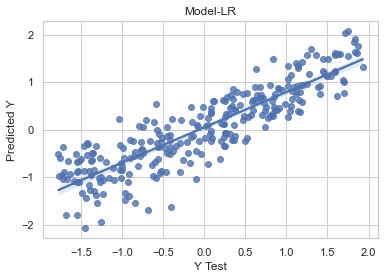

In [95]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-LR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

------------------------------------------------------------------------------------------------------------------------------

#### Cross Validation

In [96]:
for i in range(2,11):
    cv_score=cross_val_score(lr,x,y,scoring='r2',cv=i)
    cv_mean= cv_score.mean()
    cv_std= cv_score.std()
    print(f'At Cross fold {i} the cv score mean is {cv_mean*100} and the cv score std is {cv_std},testing accuracy score= {score_test*100}')
    print('\n')

At Cross fold 2 the cv score mean is 56.63842492680882 and the cv score std is 0.08323804229509729,testing accuracy score= 77.50449825862682


At Cross fold 3 the cv score mean is 56.56696262639876 and the cv score std is 0.12889227191064404,testing accuracy score= 77.50449825862682


At Cross fold 4 the cv score mean is 57.83191291900756 and the cv score std is 0.1288125014825035,testing accuracy score= 77.50449825862682


At Cross fold 5 the cv score mean is 58.46847626748356 and the cv score std is 0.11403938008993902,testing accuracy score= 77.50449825862682


At Cross fold 6 the cv score mean is 58.97643277705827 and the cv score std is 0.1245072416165715,testing accuracy score= 77.50449825862682


At Cross fold 7 the cv score mean is 58.92981766245743 and the cv score std is 0.13466264103403996,testing accuracy score= 77.50449825862682


At Cross fold 8 the cv score mean is 58.938417789362454 and the cv score std is 0.14250972254371777,testing accuracy score= 77.50449825862682




#### Polynomial with Regularization techniques

In [97]:
# Define the degree of polynomial features
degree = 2

# Create an instance of PolynomialFeatures
poly_features = PolynomialFeatures(degree=degree)

# Fit and transform the training features to polynomial features
X_train_poly = poly_features.fit_transform(x_train)

# Transform the testing features to polynomial features
X_test_poly = poly_features.transform(x_test)

### Ridge

In [98]:
# Create an instance of Ridge regression
ridge_model = Ridge()

ridge_model.fit(X_train_poly, y_train)

pred_train_ridge=ridge_model.predict(X_train_poly)
pred_test_ridge = ridge_model.predict(X_test_poly)

score_train=r2_score(y_train,pred_train_ridge)
score_test=r2_score(y_test,pred_test_ridge)
mse = mean_squared_error(y_test, pred_test_ridge)


# Print the mean squared error
print('R2_Score_train: ',score_train)
print('R2_Score_test: ',score_test)
print('RMSE = ', np.sqrt(mse).round(4))
print('The mean absolute error = ', mean_absolute_error(y_test, pred_test_ridge))

R2_Score_train:  0.8899280633508169
R2_Score_test:  0.6736008691080424
RMSE =  0.5818
The mean absolute error =  0.415513177993698


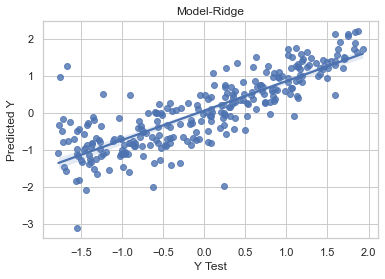

In [99]:
sns.regplot(x=y_test,y=pred_test_ridge)
plt.title("Model-Ridge")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

In [100]:
# Create an instance of Lasso regression
lasso_model = Lasso()


lasso_model.fit(X_train_poly, y_train)

pred_train_lasso=lasso_model.predict(X_train_poly)
pred_test_lasso = lasso_model.predict(X_test_poly)

score_train=r2_score(y_train,pred_train_ridge)
score_test=r2_score(y_test,pred_test_ridge)
mse = mean_squared_error(y_test, pred_test_lasso)


# Print the mean squared error
print('R2_Score_train: ',score_train)
print('R2_Score_test: ',score_test)
print('RMSE = ', np.sqrt(mse).round(4))
print('The mean absolute error = ', mean_absolute_error(y_test, pred_test_lasso))

R2_Score_train:  0.8899280633508169
R2_Score_test:  0.6736008691080424
RMSE =  1.0184
The mean absolute error =  0.8767171367423772


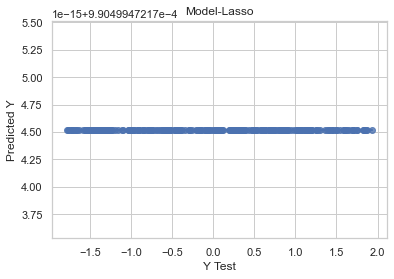

In [101]:
sns.regplot(x=y_test,y=pred_test_lasso)
plt.title("Model-Lasso")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### KNN

In [102]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
   
    knn = KNeighborsRegressor()
    knn.fit(x_train,y_train)
    pred = knn.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.6759105857372114 seen for random state: 13


In [103]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=knn.predict(x_train)
pred_test = knn.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(knn, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.6881392764992587
The r2 score_test is: 0.7753991247192666
The mean absolute error 0.38111684263820705
The mean squared error 0.24170913325998652
The cross validation score 0.4003895098399387


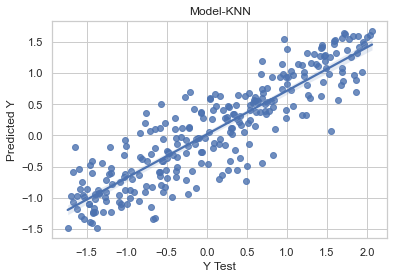

In [104]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-KNN")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### SVR

In [105]:
#Selecting the best random state to get maximum accuracy.

max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    svr = SVR()
    svr.fit(x_train,y_train)
    pred = svr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.8246345648614205 seen for random state: 78


In [106]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=svr.predict(x_train)
pred_test = svr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(svr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.8370536226629256
The r2 score_test is: 0.897737281949873
The mean absolute error 0.24337665991433358
The mean squared error 0.10891119329231773
The cross validation score 0.6705071176373198


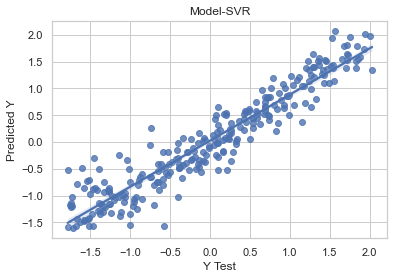

In [107]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-SVR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

------------------------------------------------------------------------------------------------------------------------------

### Decision Tree Regressor

In [108]:
#Selecting the best random state to get maximum accuracy.

max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
  
    dtr = DecisionTreeRegressor()
    dtr.fit(x_train,y_train)
    pred = dtr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.6511831322758432 seen for random state: 97


In [109]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=dtr.predict(x_train)
pred_test= dtr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(dtr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.9054934730252854
The r2 score_test is: 0.9404898274833989
The mean absolute error 0.08541800340339634
The mean squared error 0.06300406270608049
The cross validation score 0.38912876440767596


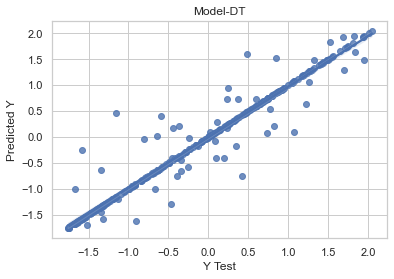

In [110]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-DT")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

------------------------------------------------------------------------------------------------------------------------------

#### Ensembels Techniques

### Random Forest Regressor

In [111]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
   
    rfr = RandomForestRegressor()
    rfr.fit(x_train,y_train)
    pred = rfr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.8448066735287931 seen for random state: 53


In [112]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=rfr.predict(x_train)
pred_test= rfr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(rfr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.9361154945831401
The r2 score_test is: 0.9468616070080762
The mean absolute error 0.15888977550479236
The mean squared error 0.053173539696581014
The cross validation score 0.6918127277878423


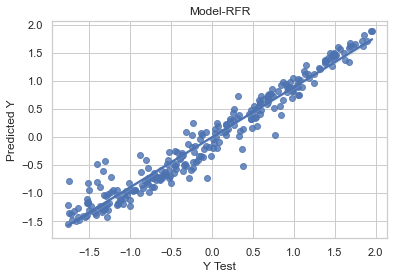

In [113]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-RFR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

------------------------------------------------------------------------------------------------------------------------------

### GB Regressor

In [114]:
#Selecting the best random state to get maximum accuracy.

max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
   
    gbr=GradientBoostingRegressor()
    gbr.fit(x_train,y_train)
    pred=gbr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.8560260556882386 seen for random state: 53


In [115]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=gbr.predict(x_train)
pred_test = gbr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(gbr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.8764374274047708
The r2 score_test is: 0.9012194638889289
The mean absolute error 0.2476119193730722
The mean squared error 0.09884587136366536
The cross validation score 0.7080156869244237


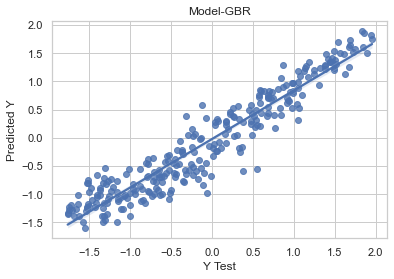

In [116]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-GBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

-----------------------------------------------------------------------------------------------------------------------------

### ADABRegressor

In [117]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    
    adr=AdaBoostRegressor()
    adr.fit(x_train,y_train)
    adr_pred=adr.predict(x_test)
    acc = r2_score(y_test, adr_pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.7840457491496801 seen for random state: 77


In [118]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=adr.predict(x_train)
pred_test = adr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(adr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.7529790211546313
The r2 score_test is: 0.7987461645979987
The mean absolute error 0.3877468324227385
The mean squared error 0.2169075712237894
The cross validation score 0.6201350134538208


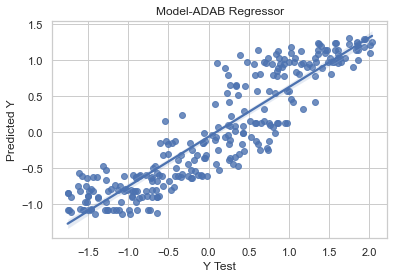

In [119]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-ADAB Regressor")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### XGB Regressor

In [120]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    xgb=XGBRegressor()
    xgb.fit(x_train,y_train)
    xgb_pred=xgb.predict(x_test)
    acc = r2_score(y_test, xgb_pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.8480488175358951 seen for random state: 53


In [121]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=xgb.predict(x_train)
pred_test= xgb.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(xgb, x,y,cv=10)
print('The cross validation score', cv.mean(),cv.std())

The r2 score_train is: 0.9640231870805867
The r2 score_test is: 0.9649652072816183
The mean absolute error 0.08412008636617131
The mean squared error 0.03505796537082887
The cross validation score 0.6855904184521384 0.10822372247578255


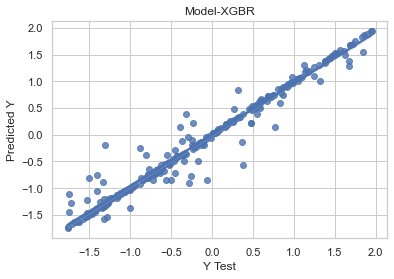

In [122]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-XGBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

In [131]:
np.random.seed(10)

def rmse_cv(model, x, y):
    rmse = -cross_val_score(model, x, y, scoring='neg_mean_squared_error', cv=10)
    return (rmse)

models = [LinearRegression(), Ridge(), Lasso(), SVR(), KNeighborsRegressor(),
          DecisionTreeRegressor(), RandomForestRegressor(), GradientBoostingRegressor(),
          AdaBoostRegressor(), XGBRegressor()]

names = ['lr', 'ridge', 'lasso', 'svr', 'knn', 'dtr', 'rfr', 'gbr', 'adr', 'xgb']

for model, name in zip(models, names):
    score = rmse_cv(model, x, y)
    print("{}: {:.6f}, {:.6f}".format(name, score.mean(), score.std()))

lr: 0.299833, 0.041523
ridge: 0.299710, 0.041280
lasso: 1.045966, 0.323917
svr: 0.252056, 0.051456
knn: 0.454564, 0.110028
dtr: 0.461761, 0.057476
rfr: 0.233230, 0.043764
gbr: 0.223431, 0.060815
adr: 0.296555, 0.073205
xgb: 0.237357, 0.060694


------------------------------------------------------------------------------------------------------------------------------

Best two for cross validation are XGB and RF regressors but XGB regressor is also better in r2 score so i will go with XGBR

### The best Algorithim is XGB Regressor 

------------------------------------------------------------------------------------------------------------------------------

In [126]:
# Tunning Hyperparameters for XGB Regressor

# Define the parameter grid
params = {
    'n_estimators': [100, 200,500,700,1000],
    'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3,5,7,9],
    'subsample': [0.8, 1],
    'colsample_bytree': [0.8,1],
    'min_child_weight': [1,5,10]
}

xgb_tuned= GridSearchCV(XGBRegressor(),params,scoring='r2',cv =10,n_jobs=-1,verbose=True)
xgb_tuned.fit(x_train,y_train)
y_pred=xgb_tuned.predict(x_test)
print('The r2 score is:', r2_score(y_test, y_pred))
print("\n The best estimator across ALL searched params:\n", xgb_tuned.best_estimator_)
print("\n The best score across ALL searched params:\n", xgb_tuned.best_score_)
print("\n The best parameters across ALL searched params:\n",xgb_tuned.best_params_)

Fitting 10 folds for each of 720 candidates, totalling 7200 fits
The r2 score is: 0.8815684750282117

 The best estimator across ALL searched params:
 XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.8,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.01, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=5,
             missing=nan, monotone_constraints='()', n_estimators=1000,
             n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, reg_lambda=1, ...)

 The best score across ALL searched params:
 0.8140901760272493

 The best parameters across ALL searched params:
 {'colsample_bytree': 0.8, 'learning_rate': 0.01,

In [128]:
# Reinstating with tuned parameters
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=53)

xgb_model = XGBRegressor(n_estimators= 1000,max_depth=5,colsample_bytree=0.8, learning_rate=0.01,min_child_weight=5
                         ,subsample=0.8).fit(x_train,y_train)

pred_train=xgb_model.predict(x_train)
pred_test= xgb_model.predict(x_test)
print('The r2 score_train is: ', r2_score(y_train, pred_train))
print('The r2 score_test is: ', r2_score(y_test, pred_test))
print('The mean absolute error ', mean_absolute_error(y_test, pred_test))
print('root_mean_squared_error: ',np.sqrt(mean_squared_error(y_test,pred_test)))

The r2 score_train is:  0.9546950558003089
The r2 score_test is:  0.8815684750282117
The mean absolute error  0.2691759711748776
root_mean_squared_error:  0.3442526074668067


In [129]:
cv = cross_val_score(xgb_model, x,y,cv=10)
print('The cross validation score', cv.mean())

The cross validation score 0.7370494324661356


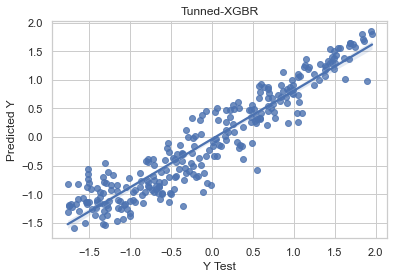

In [130]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Tunned-XGBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

## Tunning the Parameters of the Model using OPTUNA {it's a new tunning method let's try it}

In [160]:
import optuna

# Split the data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(x, y, test_size=0.2, random_state=53)

# Define the objective function to optimize using Optuna
def objective(trial):
    # Define the hyperparameters to tune
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma': trial.suggest_float('gamma', 0.0, 1.0),
        'lambda': trial.suggest_float('lambda', 0.0, 1.0),
    }

    # Create the XGB regressor with the current hyperparameters
    model = XGBRegressor(**params)

    # Train the model
    model.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], early_stopping_rounds=10, verbose=False)

    # Predict on the validation set
    y_pred = model.predict(X_valid)

    # Calculate the mean squared error as the objective to minimize
    mse = mean_squared_error(y_valid, y_pred)

    return mse

In [161]:
# Create an Optuna study object
study = optuna.create_study(direction='minimize')

# Optimize the objective function using Optuna
study.optimize(objective, n_trials=100)

# Get the best hyperparameters found by Optuna
best_params = study.best_params

[I 2023-06-09 10:08:22,616] A new study created in memory with name: no-name-ef7f68e2-5cf3-4777-9c54-20821e3122cc
[I 2023-06-09 10:08:22,840] Trial 0 finished with value: 0.1342457928959513 and parameters: {'n_estimators': 100, 'learning_rate': 0.15460052257442944, 'max_depth': 4, 'subsample': 0.614254762537551, 'colsample_bytree': 0.6273668729477506, 'gamma': 0.969693736240191, 'lambda': 0.03382746036440021}. Best is trial 0 with value: 0.1342457928959513.
[I 2023-06-09 10:08:23,064] Trial 1 finished with value: 0.2690164934933449 and parameters: {'n_estimators': 100, 'learning_rate': 0.019972574853844113, 'max_depth': 3, 'subsample': 0.6893739059120376, 'colsample_bytree': 0.5219279087438998, 'gamma': 0.09709021099362403, 'lambda': 0.6403777546748245}. Best is trial 0 with value: 0.1342457928959513.
[I 2023-06-09 10:08:23,248] Trial 2 finished with value: 0.13183693589073106 and parameters: {'n_estimators': 100, 'learning_rate': 0.198137955351355, 'max_depth': 5, 'subsample': 0.73236

[I 2023-06-09 10:08:30,048] Trial 23 finished with value: 0.13594564362077366 and parameters: {'n_estimators': 100, 'learning_rate': 0.1294746229773016, 'max_depth': 4, 'subsample': 0.8284082604922289, 'colsample_bytree': 0.8292666373082069, 'gamma': 0.15402860693117787, 'lambda': 0.2676347155508137}. Best is trial 21 with value: 0.12264540562360149.
[I 2023-06-09 10:08:30,376] Trial 24 finished with value: 0.124201714856 and parameters: {'n_estimators': 100, 'learning_rate': 0.0666702463391458, 'max_depth': 5, 'subsample': 0.7133801241171808, 'colsample_bytree': 0.9503773778123233, 'gamma': 0.3906372968976678, 'lambda': 0.34463399500843905}. Best is trial 21 with value: 0.12264540562360149.
[I 2023-06-09 10:08:30,744] Trial 25 finished with value: 0.1238962639147231 and parameters: {'n_estimators': 100, 'learning_rate': 0.06197771894876579, 'max_depth': 6, 'subsample': 0.701338046303001, 'colsample_bytree': 0.9400663953314198, 'gamma': 0.39750861912530255, 'lambda': 0.6940109053311048

[I 2023-06-09 10:08:38,136] Trial 46 finished with value: 0.13109600102083022 and parameters: {'n_estimators': 100, 'learning_rate': 0.07802613438395692, 'max_depth': 5, 'subsample': 0.6675111216467788, 'colsample_bytree': 0.9599420046302677, 'gamma': 0.05874832409709552, 'lambda': 0.4862323619033627}. Best is trial 21 with value: 0.12264540562360149.
[I 2023-06-09 10:08:38,352] Trial 47 finished with value: 0.14231702983911296 and parameters: {'n_estimators': 100, 'learning_rate': 0.17522517423273054, 'max_depth': 4, 'subsample': 0.7447511796099082, 'colsample_bytree': 0.6109121462935171, 'gamma': 0.38636330848006684, 'lambda': 0.20866558125836546}. Best is trial 21 with value: 0.12264540562360149.
[I 2023-06-09 10:08:38,713] Trial 48 finished with value: 0.12863204110065177 and parameters: {'n_estimators': 100, 'learning_rate': 0.08673667244558789, 'max_depth': 5, 'subsample': 0.7823969085161258, 'colsample_bytree': 0.9272678664385284, 'gamma': 0.2523169070778948, 'lambda': 0.2395892

[I 2023-06-09 10:08:45,944] Trial 69 finished with value: 0.1259569494848816 and parameters: {'n_estimators': 100, 'learning_rate': 0.12663278245545412, 'max_depth': 6, 'subsample': 0.7621139857458838, 'colsample_bytree': 0.9544354744095563, 'gamma': 0.05507401422295813, 'lambda': 0.4582091029079512}. Best is trial 65 with value: 0.12122317847517547.
[I 2023-06-09 10:08:46,240] Trial 70 finished with value: 0.1383487834485398 and parameters: {'n_estimators': 100, 'learning_rate': 0.12739517906986206, 'max_depth': 4, 'subsample': 0.7669701789616872, 'colsample_bytree': 0.9593852528160784, 'gamma': 0.0028671319034752965, 'lambda': 0.45358193910961525}. Best is trial 65 with value: 0.12122317847517547.
[I 2023-06-09 10:08:46,504] Trial 71 finished with value: 0.13518930816387142 and parameters: {'n_estimators': 100, 'learning_rate': 0.13974360746355993, 'max_depth': 6, 'subsample': 0.7500644372176597, 'colsample_bytree': 0.9509644789733375, 'gamma': 0.04533176665424583, 'lambda': 0.465676

[I 2023-06-09 10:08:53,496] Trial 92 finished with value: 0.1275511150014452 and parameters: {'n_estimators': 100, 'learning_rate': 0.0756878020746657, 'max_depth': 5, 'subsample': 0.7445204896412583, 'colsample_bytree': 0.877954919257045, 'gamma': 0.3331684209678099, 'lambda': 0.6899710367128293}. Best is trial 90 with value: 0.1192148004104002.
[I 2023-06-09 10:08:53,800] Trial 93 finished with value: 0.13656560183836527 and parameters: {'n_estimators': 100, 'learning_rate': 0.08203304662588302, 'max_depth': 4, 'subsample': 0.725660823640116, 'colsample_bytree': 0.9157121854065391, 'gamma': 0.31826664973384744, 'lambda': 0.780350987281424}. Best is trial 90 with value: 0.1192148004104002.
[I 2023-06-09 10:08:54,136] Trial 94 finished with value: 0.12945380757286443 and parameters: {'n_estimators': 100, 'learning_rate': 0.07062972715961174, 'max_depth': 5, 'subsample': 0.7338761364615625, 'colsample_bytree': 0.853544108007178, 'gamma': 0.4152552670360147, 'lambda': 0.7506435231684827}

In [162]:
import optuna.visualization as vis
# Visualize the optimization history
vis.plot_optimization_history(study).show()

# Visualize the importance of hyperparameters
vis.plot_param_importances(study).show()

# Visualize the slice of hyperparameters
vis.plot_slice(study).show()

In [163]:
# Train the final model using the best hyperparameters
final_model = XGBRegressor(**best_params)
final_model.fit(x, y)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1,
             colsample_bytree=0.7907959202642318, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None,
             gamma=0.33653099777526396, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             lambda=0.7270931981900924, learning_rate=0.07657789551185473,
             max_bin=256, max_cat_to_onehot=4, max_delta_step=0, max_depth=5,
             max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0, ...)

In [170]:
pred_train=final_model.predict(x_train)
pred_test= final_model.predict(X_valid)
print('The r2 score_train is: ', r2_score(y_train, pred_train))
print('The r2 score_test is: ', r2_score(y_valid, pred_test))
print('The mean absolute error ', mean_absolute_error(y_valid, pred_test))
print('mean_squared_error: ',mean_squared_error(y_valid,pred_test))
print('root_mean_squared_error: ',np.sqrt(mean_squared_error(y_valid,pred_test)))

The r2 score_train is:  0.9313805603449512
The r2 score_test is:  0.9454909837044119
The mean absolute error  0.18149265293842215
mean_squared_error:  0.05454506955555759
root_mean_squared_error:  0.23354885903287473


In [176]:
# Calculate the cross-validation score with the final model
cv_scores = cross_val_score(final_model, x, y, cv=10)

# Optuna maximizes the objective function, so negate the mean squared error
avg_mse = cv_scores.mean()

print("Cross-validation score :", avg_mse)

Cross-validation score : 0.7336818266138831


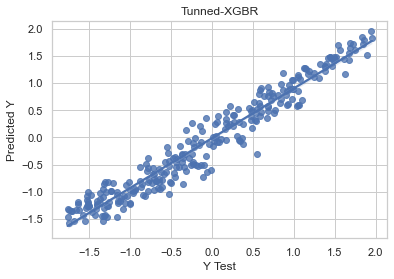

In [177]:
sns.regplot(x=y_valid,y=pred_test)
plt.title("Tunned-XGBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

------------------------------------------------------------------------------------------------------------------------------

### Conclusion

After using two different techniques of tunning the parameters of XGB regressor Algorithm. {GridSearchCV & OPTUNA}

The OPTUNA one was better than GridSearch in all the evaluation metrics also in the cross validation performance, But the 
orginal XGB Model before tunning is the best one in all the evaluation metrics but not in the CV as it score almost 69%
Therefor i will go with the Orginal XGB regressor Model to be my Final used Model.
*******************************************************************************************************************************
Evaluation Metrics & CV results:
    
The r2 score_train is: 0.9640231870805867
The r2 score_test is: 0.9649652072816183
The mean absolute error 0.08412008636617131
The mean squared error 0.03505796537082887
The cross validation score 0.6855904184521384 0.10822372247578255

------------------------------------------------------------------------------------------------------------------------------

### Saving the Model

In [135]:
#Saving the model using .pkl
import joblib
joblib.dump(xgb,'E:/DataTrained/Capstone_Project/IMDB_XGB.pkl')

['E:/DataTrained/Capstone_Project/IMDB.pkl']

In [136]:
# load model and get predictions

model_1=joblib.load('E:/DataTrained/Capstone_Project/IMDB_XGB.pkl')

#Predict

prediction_1 = model.predict(x_test)

In [137]:
pd.DataFrame([model_1.predict(x_test)[:], y_test[:]], index = ['Predicted', 'Original'])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277
Predicted,0.309437,0.906539,0.259719,0.027302,-0.614252,0.531717,-1.012521,-0.351649,-0.378148,-0.090930,0.156897,1.266842,1.071433,0.039492,-0.128990,1.682031,-0.190850,0.690558,1.101650,-1.456135,-0.352275,-0.151757,-0.737221,0.856388,1.491163,-1.044889,0.191711,1.477270,0.741563,1.463233,-0.554855,-0.769414,1.200703,0.731590,0.613440,-1.051228,0.214513,-1.009178,-1.187115,-0.965209,-1.240681,0.781245,0.497010,1.012228,0.510143,-0.522176,1.533597,-0.736453,-0.394033,1.703731,0.504965,1.829683,-0.198255,0.275296,0.059813,-0.969404,-0.193017,-0.408884,1.584174,1.042566,0.103799,-1.069344,0.210602,-0.649839,0.261034,-0.494137,-1.031047,1.495740,0.635162,-0.672221,-0.890908,0.713083,-0.838329,1.387520,-0.259975,-1.183332,-0.291808,1.426450,-1.218464,-1.475409,-0.624576,0.738186,1.748011,0.751452,0.533739,-0.048343,-1.440331,0.729007,-1.479161,1.042084,-0.163444,-0.681108,-1.353489,1.373289,-0.220751,-1.110255,0.981817,-0.817865,0.146630,-1.490372,0.197591,1.286312,-1.511424,-0.722059,-1.362462,-0.042732,-0.338889,-1.178730,-0.371314,-1.367474,0.661181,1.008879,-1.634441,-0.574434,1.383991,-1.450469,1.415857,-1.580156,0.965832,0.394603,-1.129033,0.381311,0.117763,1.944263,-0.377231,1.939025,-1.539020,0.326347,-0.500339,0.092536,0.589109,-0.376350,-1.733887,-0.696860,-0.749563,-0.552397,0.975257,0.899895,0.829694,0.207545,-1.278244,-1.752308,-1.547695,1.213566,0.607350,-1.290911,-0.941200,-1.400019,0.523764,1.501728,1.035809,-1.289580,-0.236020,0.024890,-0.071635,0.654175,0.485077,0.982033,0.594569,0.482975,1.086354,-0.842205,1.298261,0.389084,-1.080518,-1.366472,1.053701,-0.136573,-0.575335,-0.440753,-0.724817,1.547961,-1.616155,-0.817656,-0.190776,1.440741,-1.089241,-1.583980,-1.280853,0.554969,0.919690,-1.475458,-1.673695,0.467792,-1.470754,1.301342,1.165331,0.235433,-0.663483,1.047886,-0.063603,1.684423,-1.128530,1.333717,-1.207236,-1.208035,-1.537284,0.473985,0.849788,-1.250392,-1.177823,-0.449621,0.710068,-0.843182,0.176750,-1.624248,-0.699857,0.056713,0.213939,0.337959,0.138042,-0.846532,-0.398520,-0.849205,-1.105926,1.382486,-1.040454,-1.257605,1.537367,-1.334389,1.174613,0.230659,1.482139,-1.151340,1.567618,1.875999,-1.618999,0.991857,0.039372,-1.455788,-1.343492,0.920666,-0.805138,-0.68705,-1.341891,-1.62701,-0.529273,0.633423,-0.718390,-0.753003,-0.148718,0.718669,-0.255881,0.947238,0.680077,-1.326740,-0.497218,-0.806371,-0.707507,-0.195953,0.039156,0.548726,-0.941461,1.857076,-0.841564,0.328241,-0.380564,-0.566759,-0.774592,0.698026,0.150080,-0.912919,-0.120799,0.061280,-0.024714,1.065854,-0.767975,-1.034155,-0.517812,-1.124503,1.487482,-0.662633,-0.143054,0.895145,-0.908680,-0.803779,-0.650407,-0.234392
Original,0.312885,0.902805,0.224380,0.012710,-0.605559,0.484562,-1.014415,-0.352934,-0.367542,-0.240652,0.169016,1.250675,0.979627,0.038510,-0.135479,1.686044,-1.304882,0.687659,1.251739,-1.522627,-0.321553,-0.113481,-0.777278,0.805405,1.626347,-1.067578,0.200643,1.470995,0.745791,1.462263,-0.509464,-0.252238,1.187538,0.690107,0.599965

The Results are Excellent.

-------------------------------------------------------------------------------------------------------------------------------

## Regression Problem (Gross_Collection)

In [178]:
# Votes is the target feature now.
x = dfgross_new.drop('Gross_Collection_$M',axis=1)
y = dfgross_new['Gross_Collection_$M']

### Standarization

In [179]:
sc= StandardScaler()
x = pd.DataFrame(sc.fit_transform(x), columns = x.columns)
x

,Director_1,Director_2,Director_3,Duration,Ratings,Metascore,Popularity,Stars_1,Stars_2,Stars_3,Stars_4,Votes,Year_from_2023,Genre_1_Animation,Genre_2_Adventure,Genre_2_Biography,Genre_2_Comedy,Genre_2_Crime,Genre_2_Drama,Genre_2_Family,Genre_2_Fantasy,Genre_2_Horror,Genre_2_Mystery,Genre_2_NA,Genre_2_Romance,Genre_2_Sci-Fi,Genre_2_Sport,Genre_2_Thriller,Genre_2_War,Genre_3_Biography,Genre_3_Comedy,Genre_3_Crime,Genre_3_Drama,Genre_3_Family,Genre_3_Fantasy,Genre_3_History,Genre_3_Horror,Genre_3_Music,Genre_3_Mystery,Genre_3_NA,Genre_3_Romance,Genre_3_Sci-Fi,Genre_3_Sport,Genre_3_Thriller,Genre_3_War,Genre_3_Western,Certification_Approved,Certification_G,Certification_Not Rated,Certification_PG,Certification_PG-13,Certification_R
0,-0.823642,-4.315897,-19.941581,0.378732,2.428321,2.279693,-1.720892,-0.883055,-0.724143,0.283985,0.624782,1.644313,0.545973,4.944371,-0.782215,-0.116445,-0.394405,-0.501045,-0.338573,-0.028928,-0.112699,-0.183597,-0.123613,-0.040927,-0.028928,-0.195434,-0.028928,-0.168448,-0.028928,-0.071007,-0.315063,-0.323017,-0.442719,-0.133687,-0.276600,-0.143101,-0.18115,-0.028928,-0.157639,-0.274845,-0.108832,-0.419533,-0.104828,-0.484006,-0.096347,-0.057928,-0.040927,-0.071007,-0.160403,2.544602,-0.823055,-0.868139
1,-0.148933,0.231828,0.050146,1.352127,2.428321,2.084802,-1.450188,-0.721467,-0.724143,-0.659477,-0.561312,1.885040,-1.405605,-0.202250,1.278421,-0.116445,-0.394405,-0.501045,-0.338573,-0.028928,-0.112699,-0.183597,-0.123613,-0.040927,-0.028928,-0.195434,-0.028928,-0.168448,-0.028928,-0.071007,-0.315063,-0.323017,-0.442719,-0.133687,-0.276600,-0.143101,-0.18115,-0.028928,-0.157639,-0.274845,-0.108832,2.383603,-0.104828,-0.484006,-0.096347,-0.057928,-0.040927,-0.071007,-0.160403,-0.392989,-0.823055,1.151889
2,1.200487,0.231828,0.050146,2.534333,2.306808,1.565093,-1.740076,-0.721467,-0.724143,0.283985,0.624782,1.810774,-0.465957,-0.202250,-0.782215,-0.116445,-0.394405,1.995829,-0.338573,-0.028928,-0.112699,-0.183597,-0.123613,-0.040927,-0.028928,-0.195434,-0.028928,-0.168448,-0.028928,-0.071007,-0.315063,-0.323017,2.258770,-0.133687,-0.276600,-0.143101,-0.18115,-0.028928,-0.157639,-0.274845,-0.108832,-0.419533,-0.104828,-0.484006,-0.096347,-0.057928,-0.040927,-0.071007,-0.160403,-0.392989,-0.823055,1.151889
3,-0.823642,0.231828,0.050146,2.251552,2.306808,1.850933,0.449002,-0.721467,-0.724143,-0.659477,-0.561312,0.582249,1.413341,-0.202250,-0.782215,8.587782,-0.394405,-0.501045,-0.338573,-0.028928,-0.112699,-0.183597,-0.123613,-0.040927,-0.028928,-0.195434,-0.028928,-0.168448,-0.028928,-0.071007,-0.315063,-0.323017,2.258770,-0.133687,-0.276600,-0.143101,-0.18115,-0.028928,-0.157639,-0.274845,-0.108832,-0.419533,-0.104828,-0.484006,-0.096347,-0.057928,-0.040927,-0.071007,6.234314,-0.392989,-0.823055,-0.868139
4,-0.823642,0.231828,0.050146,2.473643,2.306808,1.993853,1.263245,-0.883055,-0.724143,-0.659477,-0.561312,0.207390,-1.333325,-0.202250,-0.782215,-0.116445,-0.394405,1.995829,-0.338573,-0.028928,-0.112699,-0.183597,-0.123613,-0.040927,-0.028928,-0.195434,-0.028928,-0.168448,-0.028928,-0.071007,-0.315063,-0.323017,2.258770,-0.133687,-0.276600,-0.143101,-0.18115,-0.028928,-0.157639,-0.274845,-0.108832,-0.419533,-0.104828,-0.484006,-0.096347,-0.057928,-0.040927,-0.071007,6.234314,-0.392989,-0.823055,-0.868139
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1191,-0.823642,0.231828,0.050146,0.896798,-3.161257,-2.397692,0.981883,1.379165,0.540200,0.283985,-0.561312,-0.987759,-0.104553,-0.202250,1.278421,-0.116445,-0.394405,-0.501045,-0.338573,-0.028928,-0.112699,-0.183597,-0.123613,-0.040927,-0.028928,-0.195434,-0.028928,-0.168448,-0.028928,-0.071007,-0.315063,-0.323017,-0.442719,-0.133687,3.615327,-0.143101,-0.18115,-0.028928,-0.157639,-0.274845,-0.108832,-0.419533,-0.104828,-0.484006,-0.096347,-0.057928,-0.040927,-0.071007,-0.160403,-0.392989

### Feature Reduction

##### F-Regression

In [180]:
F_values, p_values  = f_regression(x, y )

import itertools
f_reg_results = [(i, v, z) for i, v, z in itertools.zip_longest(x.columns, F_values,  ['%.3f' % p for p in p_values])]
f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])

f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])
f_reg_results = f_reg_results.sort_values(by=['P_Value']).head(25)

In [181]:
f_reg_results

,Variable,F_Value,P_Value
0,Director_1,77.735457,0.000
49,Certification_PG,17.226332,0.000
48,Certification_Not Rated,92.682028,0.000
41,Genre_3_Sci-Fi,19.500477,0.000
32,Genre_3_Drama,46.551354,0.000
50,Certification_PG-13,141.258253,0.000
17,Genre_2_Crime,53.121384,0.000
14,Genre_2_Adventure,100.556278,0.000
11,Votes,1069.001808,0.000
10,Stars_4,43.669426,0.000


In [220]:
l1_fr=f_reg_results['Variable'][:-6].values  # CI=0.90
l1_fr

array(['Director_1', 'Certification_PG', 'Certification_Not Rated',
       'Genre_3_Sci-Fi', 'Genre_3_Drama', 'Certification_PG-13',
       'Genre_2_Crime', 'Genre_2_Adventure', 'Votes', 'Stars_4',
       'Certification_R', 'Stars_2', 'Duration', 'Stars_1', 'Popularity',
       'Ratings', 'Stars_3', 'Metascore', 'Genre_2_Comedy'], dtype=object)

#### RFE

In [251]:
rfe = RFE(RandomForestRegressor(), n_features_to_select=7).fit(x,y)

l2_rfe = x.columns[rfe.get_support()]

In [252]:
l2_rfe

Index(['Duration', 'Votes', 'Metascore', 'Year_from_2023', 'Ratings', 'Certification_PG',
       'Popularity'],
      dtype='object')

#### SKB

In [253]:
SKB = SelectKBest(f_classif, k=7).fit(x, y )

l3_skb = x.columns[SKB.get_support()]

In [254]:
l3_skb

Index(['Genre_3_Western', 'Certification_Approved', 'Genre_2_War', 'Genre_3_Biography',
       'Genre_3_Music', 'Genre_3_War', 'Genre_3_Family'],
      dtype='object')

In [255]:

list(set(list(l1_fr)+list(l2_rfe)+list(l3_skb)))

['Director_1',
 'Certification_Not Rated',
 'Stars_1',
 'Genre_2_Crime',
 'Duration',
 'Genre_3_Western',
 'Genre_3_Sci-Fi',
 'Certification_PG-13',
 'Votes',
 'Metascore',
 'Stars_4',
 'Year_from_2023',
 'Certification_R',
 'Certification_Approved',
 'Ratings',
 'Genre_2_Comedy',
 'Certification_PG',
 'Genre_2_War',
 'Genre_3_Biography',
 'Genre_3_Music',
 'Stars_2',
 'Genre_3_War',
 'Genre_3_Family',
 'Genre_3_Drama',
 'Genre_2_Adventure',
 'Popularity',
 'Stars_3']

In [256]:
final_list= ['Director_1',
 'Certification_Not Rated',
 'Stars_1',
 'Genre_2_Crime',
 'Duration',
 'Genre_3_Western',
 'Genre_3_Sci-Fi',
 'Certification_PG-13',
 'Votes',
 'Metascore',
 'Stars_4',
 'Year_from_2023',
 #'Certification_R',
 'Certification_Approved',
 'Ratings',
 'Genre_2_Comedy',
 'Certification_PG',
 'Genre_2_War',
 'Genre_3_Biography',
 'Genre_3_Music',
 'Stars_2',
 'Genre_3_War',
 'Genre_3_Family',
 'Genre_3_Drama',
 'Genre_2_Adventure',
 'Popularity',
 'Stars_3']

### VIF check Multicollinarity

In [257]:
x = x[final_list]
y = y

In [258]:
vif = pd.DataFrame()
vif["VIF_Factor"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif["features"] = x.columns

In [259]:
vif.sort_values(by='VIF_Factor', ascending=False, inplace=True)
vif

,VIF_Factor,features
8,4.093720,Votes
13,3.158961,Ratings
24,2.923656,Popularity
9,2.370776,Metascore
3,1.857413,Genre_2_Crime
23,1.815510,Genre_2_Adventure
7,1.569683,Certification_PG-13
4,1.553739,Duration
15,1.516995,Certification_PG
22,1.457927,Genre_3_Drama


There are now no Multicollinarity between the final features as Independent feature VIF is within permissible limit of 10

-------------------------------------------------------------------------------------------------------------------------------

# ML Algos

In [260]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    lr= LinearRegression()
    lr.fit(x_train,y_train)
    pred = lr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.6804309994826714 seen for random state: 31


#### Split the data

In [261]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=max_RS)

### Linear Regression

In [262]:
lr=LinearRegression()
lr.fit(x_train,y_train)
pred_train=lr.predict(x_train)
pred_test=lr.predict(x_test)
score_train=r2_score(y_train,pred_train)
score_test=r2_score(y_test,pred_test)
mse = mean_squared_error(y_test, pred_test)

In [263]:
print('R2_Score_train: ',score_train)
print('R2_Score_test: ',score_test)
print('RMSE = ', np.sqrt(mse).round(4))
print('The mean absolute error = ', mean_absolute_error(y_test, pred_test))

R2_Score_train:  0.6117977811992283
R2_Score_test:  0.6804309994826714
RMSE =  0.5814
The mean absolute error =  0.4623961541647329


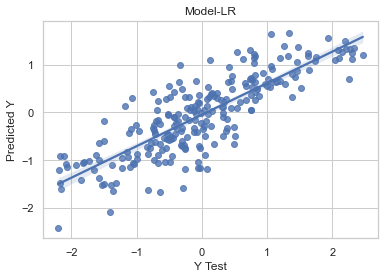

In [264]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-LR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

#### Cross Validation

In [265]:
for i in range(2,11):
    cv_score=cross_val_score(lr,x,y,scoring='r2',cv=i)
    cv_mean= cv_score.mean()
    cv_std= cv_score.std()
    print(f'At Cross fold {i} the cv score mean is {cv_mean*100} and the cv score std is {cv_std},testing accuracy score= {score_test*100}')
    print('\n')

At Cross fold 2 the cv score mean is 50.57717720705091 and the cv score std is 0.07698638494009696,testing accuracy score= 68.04309994826714


At Cross fold 3 the cv score mean is 49.50492176599581 and the cv score std is 0.11997603278703893,testing accuracy score= 68.04309994826714


At Cross fold 4 the cv score mean is 51.761824283803634 and the cv score std is 0.14344297174749632,testing accuracy score= 68.04309994826714


At Cross fold 5 the cv score mean is 54.084219902621854 and the cv score std is 0.0944399384948254,testing accuracy score= 68.04309994826714


At Cross fold 6 the cv score mean is 53.657029007388616 and the cv score std is 0.11165463006543301,testing accuracy score= 68.04309994826714


At Cross fold 7 the cv score mean is 53.333785671300106 and the cv score std is 0.13104391677956473,testing accuracy score= 68.04309994826714


At Cross fold 8 the cv score mean is 52.64446309689856 and the cv score std is 0.13840237976943498,testing accuracy score= 68.0430999482671

-------------------------------------------------------------------------------------------------------------------------------

#### Polynomial with Regularization techniques

In [266]:
# Define the degree of polynomial features
degree = 2

# Create an instance of PolynomialFeatures
poly_features = PolynomialFeatures(degree=degree)

# Fit and transform the training features to polynomial features
X_train_poly = poly_features.fit_transform(x_train)

# Transform the testing features to polynomial features
X_test_poly = poly_features.transform(x_test)

### Ridge

In [267]:
# Create an instance of Ridge regression
ridge_model = Ridge()

ridge_model.fit(X_train_poly, y_train)

pred_train_ridge=ridge_model.predict(X_train_poly)
pred_test_ridge = ridge_model.predict(X_test_poly)

score_train=r2_score(y_train,pred_train_ridge)
score_test=r2_score(y_test,pred_test_ridge)
mse = mean_squared_error(y_test, pred_test_ridge)

# Print the mean squared error
print('R2_Score_train: ',score_train)
print('R2_Score_test: ',score_test)
print('RMSE = ', np.sqrt(mse).round(4))
print('The mean absolute error = ', mean_absolute_error(y_test, pred_test_ridge))

R2_Score_train:  0.7630783815426706
R2_Score_test:  0.45244679691017364
RMSE =  0.7611
The mean absolute error =  0.535723066172799


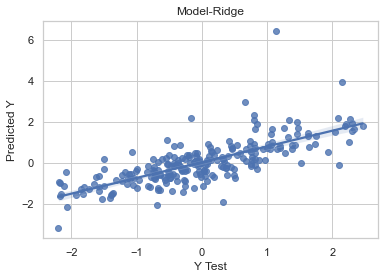

In [268]:
sns.regplot(x=y_test,y=pred_test_ridge)
plt.title("Model-Ridge")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()


### Lasso

In [269]:
# Create an instance of Lasso regression
lasso_model = Lasso()


lasso_model.fit(X_train_poly, y_train)

pred_train_lasso=lasso_model.predict(X_train_poly)
pred_test_lasso = lasso_model.predict(X_test_poly)

score_train=r2_score(y_train,pred_train_ridge)
score_test=r2_score(y_test,pred_test_ridge)
mse = mean_squared_error(y_test, pred_test_lasso)


# Print the mean squared error
print('R2_Score_train: ',score_train)
print('R2_Score_test: ',score_test)
print('RMSE = ', np.sqrt(mse).round(4))
print('The mean absolute error = ', mean_absolute_error(y_test, pred_test_lasso))

R2_Score_train:  0.7630783815426706
R2_Score_test:  0.45244679691017364
RMSE =  1.0118
The mean absolute error =  0.7990960150502119


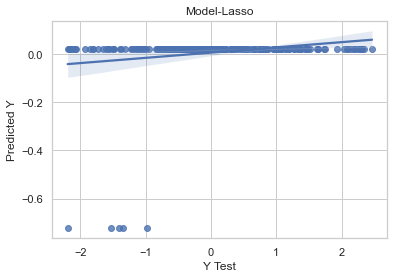

In [270]:
sns.regplot(x=y_test,y=pred_test_lasso)
plt.title("Model-Lasso")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

------------------------------------------------------------------------------------------------------------------------------

### KNN

In [271]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
   
    knn = KNeighborsRegressor()
    knn.fit(x_train,y_train)
    pred = knn.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.6106596328576737 seen for random state: 12


In [272]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=knn.predict(x_train)
pred_test = knn.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(knn, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.6448400092009656
The r2 score_test is: 0.7104131560071704
The mean absolute error 0.4351749148121086
The mean squared error 0.3260308681873791
The cross validation score 0.47873441655077426


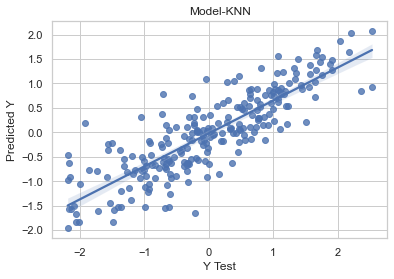

In [273]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-KNN")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### SVR

In [274]:
#Selecting the best random state to get maximum accuracy.

max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    svr = SVR()
    svr.fit(x_train,y_train)
    pred = svr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.7164227939450973 seen for random state: 60


In [275]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=svr.predict(x_train)
pred_test = svr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(svr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.732137945775902
The r2 score_test is: 0.8151282109416456
The mean absolute error 0.2932458199502818
The mean squared error 0.17329949239640402
The cross validation score 0.5919736226640593


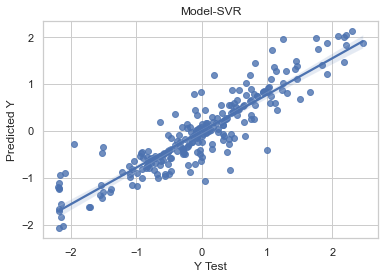

In [276]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-SVR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

------------------------------------------------------------------------------------------------------------------------------

### Decision Tree Regressor

In [277]:
#Selecting the best random state to get maximum accuracy.

max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
  
    dtr = DecisionTreeRegressor()
    dtr.fit(x_train,y_train)
    pred = dtr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.456739626634758 seen for random state: 94


In [278]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

In [279]:
pred_train=dtr.predict(x_train)
pred_test= dtr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(dtr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.8434048148065235
The r2 score_test is: 0.9164991000749098
The mean absolute error 0.08732231934740572
The mean squared error 0.09456044412350773
The cross validation score 0.13648999872511977


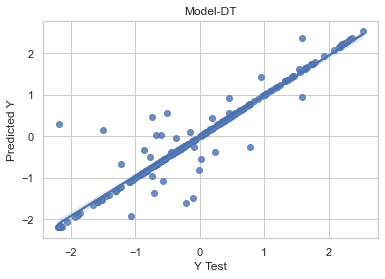

In [280]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-DT")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

#### Ensembels Techniques

### Random Forest Regressor

In [283]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
   
    rfr = RandomForestRegressor()
    rfr.fit(x_train,y_train)
    pred = rfr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.7206921057931315 seen for random state: 86


In [284]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

In [285]:
pred_train=rfr.predict(x_train)
pred_test= rfr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(rfr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.8802743489096676
The r2 score_test is: 0.9090820472168338
The mean absolute error 0.21183144091021847
The mean squared error 0.08905721382251824
The cross validation score 0.5720479081738556


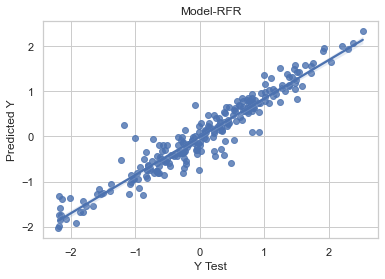

In [286]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-RFR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### GB Regressor

In [287]:
#Selecting the best random state to get maximum accuracy.

max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
   
    gbr=GradientBoostingRegressor()
    gbr.fit(x_train,y_train)
    pred=gbr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.7298953906042875 seen for random state: 22


In [288]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=gbr.predict(x_train)
pred_test = gbr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(gbr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.7816786338363222
The r2 score_test is: 0.8174868782906902
The mean absolute error 0.3432608125110705
The mean squared error 0.18151899064913907
The cross validation score 0.6048956490516344


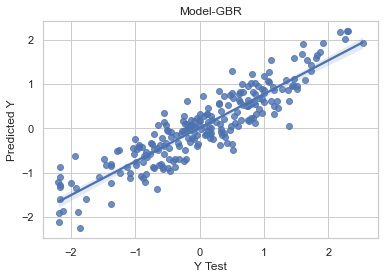

In [289]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-GBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

------------------------------------------------------------------------------------------------------------------------------

### ADABRegressor

In [290]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    
    adr=AdaBoostRegressor()
    adr.fit(x_train,y_train)
    adr_pred=adr.predict(x_test)
    acc = r2_score(y_test, adr_pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.6451188760912439 seen for random state: 31


In [291]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=adr.predict(x_train)
pred_test = adr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(adr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.6168157624435622
The r2 score_test is: 0.6827029815570546
The mean absolute error 0.48607399409326035
The mean squared error 0.3356639228004688
The cross validation score 0.5143512459274463


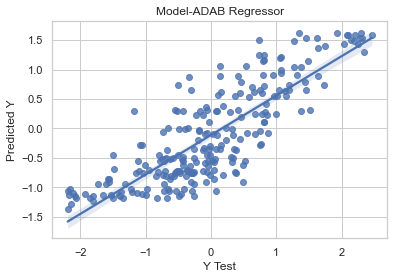

In [292]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-ADAB Regressor")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

------------------------------------------------------------------------------------------------------------------------------

### XGB Regressor

In [306]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    xgb=XGBRegressor()
    xgb.fit(x_train,y_train)
    xgb_pred=xgb.predict(x_test)
    acc = r2_score(y_test, xgb_pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.6917203613772316 seen for random state: 22


In [307]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=xgb.predict(x_train)
pred_test= xgb.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(xgb, x,y,cv=10)
print('The cross validation score', cv.mean(),cv.std())

The r2 score_train is: 0.9269735738236903
The r2 score_test is: 0.9073744789062477
The mean absolute error 0.12484102258640235
The mean squared error 0.09212099897160891
The cross validation score 0.5320249992649468 0.15967725491526194


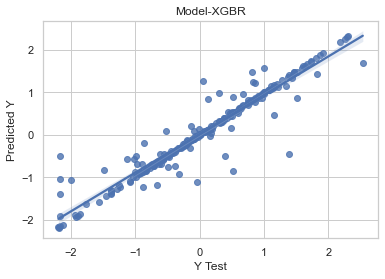

In [308]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-XGBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

In [296]:
np.random.seed(10)

def rmse_cv(model, x, y):
    rmse = -cross_val_score(model, x, y, scoring='neg_mean_squared_error', cv=10)
    return (rmse)

models = [LinearRegression(), Ridge(), Lasso(), SVR(), KNeighborsRegressor(),
          DecisionTreeRegressor(), RandomForestRegressor(), GradientBoostingRegressor(),
          AdaBoostRegressor(), XGBRegressor()]

names = ['lr', 'ridge', 'lasso', 'svr', 'knn', 'dtr', 'rfr', 'gbr', 'adr', 'xgb']

for model, name in zip(models, names):
    score = rmse_cv(model, x, y)
    print("{}: {:.6f}, {:.6f}".format(name, score.mean(), score.std()))

lr: 0.401560, 0.082754
ridge: 0.401426, 0.082657
lasso: 1.014022, 0.263229
svr: 0.360138, 0.076788
knn: 0.465961, 0.094978
dtr: 0.773319, 0.192414
rfr: 0.386150, 0.099311
gbr: 0.350181, 0.068963
adr: 0.438036, 0.079718
xgb: 0.417567, 0.120481


------------------------------------------------------------------------------------------------------------------------------


### The best Algorithim is XGB Regressor

-------------------------------------------------------------------------------------------------------------------------------

### Tunning the Parameters of the Model using OPTUNA and GridSearchCV

In [297]:
# Split the data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(x, y, test_size=0.2, random_state=22)

# Define the objective function to optimize using Optuna
def objective(trial):
    # Define the hyperparameters to tune
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma': trial.suggest_float('gamma', 0.0, 1.0),
        'lambda': trial.suggest_float('lambda', 0.0, 1.0),
    }

    # Create the XGB regressor with the current hyperparameters
    model = XGBRegressor(**params)

    # Train the model
    model.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], early_stopping_rounds=10, verbose=False)

    # Predict on the validation set
    y_pred = model.predict(X_valid)

    # Calculate the mean squared error as the objective to minimize
    mse = mean_squared_error(y_valid, y_pred)

    return mse

In [298]:
# Create an Optuna study object
study = optuna.create_study(direction='minimize')

# Optimize the objective function using Optuna
study.optimize(objective, n_trials=100)

# Get the best hyperparameters found by Optuna
best_params = study.best_params

[I 2023-06-09 11:48:26,991] A new study created in memory with name: no-name-e7bcc6f0-c1a0-4a34-8fb1-18aef91364f6
[I 2023-06-09 11:48:27,413] Trial 0 finished with value: 0.2910131774657026 and parameters: {'n_estimators': 100, 'learning_rate': 0.1316497616352193, 'max_depth': 9, 'subsample': 0.9622268568602655, 'colsample_bytree': 0.9761038282364771, 'gamma': 0.5716106627109548, 'lambda': 0.5360098214920486}. Best is trial 0 with value: 0.2910131774657026.
[I 2023-06-09 11:48:27,760] Trial 1 finished with value: 0.2840659240576179 and parameters: {'n_estimators': 100, 'learning_rate': 0.06993959072815308, 'max_depth': 10, 'subsample': 0.6554105152709466, 'colsample_bytree': 0.6127284092892047, 'gamma': 0.6189707550629224, 'lambda': 0.7284599428704379}. Best is trial 1 with value: 0.2840659240576179.
[I 2023-06-09 11:48:28,113] Trial 2 finished with value: 0.28967527399994064 and parameters: {'n_estimators': 100, 'learning_rate': 0.08462790259557808, 'max_depth': 9, 'subsample': 0.8955

[I 2023-06-09 11:48:33,356] Trial 23 finished with value: 0.25064898181510015 and parameters: {'n_estimators': 100, 'learning_rate': 0.11975296527935271, 'max_depth': 5, 'subsample': 0.7641154103082899, 'colsample_bytree': 0.7782146297282062, 'gamma': 0.39815655500711467, 'lambda': 0.9088584506597281}. Best is trial 18 with value: 0.24600179687031087.
[I 2023-06-09 11:48:33,646] Trial 24 finished with value: 0.24921163801073695 and parameters: {'n_estimators': 100, 'learning_rate': 0.11769903099013725, 'max_depth': 6, 'subsample': 0.7617163621496309, 'colsample_bytree': 0.7783567753113086, 'gamma': 0.08795597596602842, 'lambda': 0.7623554602352751}. Best is trial 18 with value: 0.24600179687031087.
[I 2023-06-09 11:48:33,978] Trial 25 finished with value: 0.27614593425540956 and parameters: {'n_estimators': 100, 'learning_rate': 0.09067691478990032, 'max_depth': 7, 'subsample': 0.6941577286223408, 'colsample_bytree': 0.8604612290559852, 'gamma': 0.006666375005421554, 'lambda': 0.777312

[I 2023-06-09 11:48:39,595] Trial 46 finished with value: 0.29646842670281587 and parameters: {'n_estimators': 100, 'learning_rate': 0.10396187402731188, 'max_depth': 9, 'subsample': 0.9163566183837147, 'colsample_bytree': 0.9359938544020596, 'gamma': 0.932515590193207, 'lambda': 0.1943752765272932}. Best is trial 18 with value: 0.24600179687031087.
[I 2023-06-09 11:48:39,843] Trial 47 finished with value: 0.26539952637638764 and parameters: {'n_estimators': 100, 'learning_rate': 0.06761217628903843, 'max_depth': 4, 'subsample': 0.7058213030264071, 'colsample_bytree': 0.8015942369440795, 'gamma': 0.7464112170132033, 'lambda': 0.9386698657602277}. Best is trial 18 with value: 0.24600179687031087.
[I 2023-06-09 11:48:40,116] Trial 48 finished with value: 0.2558922865742821 and parameters: {'n_estimators': 100, 'learning_rate': 0.13760534319020576, 'max_depth': 5, 'subsample': 0.8279445008570525, 'colsample_bytree': 0.7758443519596099, 'gamma': 0.4360899069458191, 'lambda': 0.318598474019

[I 2023-06-09 11:48:45,284] Trial 69 finished with value: 0.2803735567432099 and parameters: {'n_estimators': 100, 'learning_rate': 0.15129444057571256, 'max_depth': 6, 'subsample': 0.7560757590079215, 'colsample_bytree': 0.5693533995604558, 'gamma': 0.5307114762142287, 'lambda': 0.7952451400436481}. Best is trial 55 with value: 0.2442680246206722.
[I 2023-06-09 11:48:45,512] Trial 70 finished with value: 0.260187970290821 and parameters: {'n_estimators': 100, 'learning_rate': 0.16187333614565563, 'max_depth': 3, 'subsample': 0.8809279905291798, 'colsample_bytree': 0.9060721034922368, 'gamma': 0.05083252542028264, 'lambda': 0.9981433580348503}. Best is trial 55 with value: 0.2442680246206722.
[I 2023-06-09 11:48:45,711] Trial 71 finished with value: 0.25740359371494775 and parameters: {'n_estimators': 100, 'learning_rate': 0.14511947147465015, 'max_depth': 4, 'subsample': 0.9249157268362003, 'colsample_bytree': 0.6024849150698348, 'gamma': 0.4709523083284759, 'lambda': 0.91004862934289

[I 2023-06-09 11:48:50,857] Trial 92 finished with value: 0.2601186771092901 and parameters: {'n_estimators': 100, 'learning_rate': 0.11258550611981871, 'max_depth': 5, 'subsample': 0.9701039415191706, 'colsample_bytree': 0.7703599264882979, 'gamma': 0.4466627805058095, 'lambda': 0.8764919514424101}. Best is trial 55 with value: 0.2442680246206722.
[I 2023-06-09 11:48:51,172] Trial 93 finished with value: 0.2639829613432517 and parameters: {'n_estimators': 100, 'learning_rate': 0.1400167349548526, 'max_depth': 6, 'subsample': 0.9836108962793947, 'colsample_bytree': 0.8581206896268428, 'gamma': 0.375031125551778, 'lambda': 0.9794048911822564}. Best is trial 55 with value: 0.2442680246206722.
[I 2023-06-09 11:48:51,425] Trial 94 finished with value: 0.25389857221773904 and parameters: {'n_estimators': 100, 'learning_rate': 0.1232540967899897, 'max_depth': 5, 'subsample': 0.9546531983634334, 'colsample_bytree': 0.8076129793789332, 'gamma': 0.2195260314997388, 'lambda': 0.9085399732900493}

In [299]:
# Visualize the optimization history
vis.plot_optimization_history(study).show()

# Visualize the importance of hyperparameters
vis.plot_param_importances(study).show()

# Visualize the slice of hyperparameters
vis.plot_slice(study).show()

In [300]:
# Train the final model using the best hyperparameters
final_model = XGBRegressor(**best_params)
final_model.fit(x, y)

pred_train=final_model.predict(x_train)
pred_test= final_model.predict(X_valid)
print('The r2 score_train is: ', r2_score(y_train, pred_train))
print('The r2 score_test is: ', r2_score(y_valid, pred_test))
print('The mean absolute error ', mean_absolute_error(y_valid, pred_test))
print('mean_squared_error: ',mean_squared_error(y_valid,pred_test))
print('root_mean_squared_error: ',np.sqrt(mean_squared_error(y_valid,pred_test)))

The r2 score_train is:  0.869617223909352
The r2 score_test is:  0.8870493097049449
The mean absolute error  0.2686905539703105
mean_squared_error:  0.11233545897120058
root_mean_squared_error:  0.33516482358863464


In [301]:
# Calculate the cross-validation score with the final model
cv_scores = cross_val_score(final_model, x, y, cv=10)

# Optuna maximizes the objective function, so negate the mean squared error
avg_mse = cv_scores.mean()

print("Cross-validation score :", avg_mse)

Cross-validation score : 0.6012124641214586


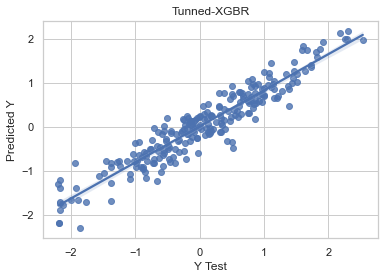

In [302]:
sns.regplot(x=y_valid,y=pred_test)
plt.title("Tunned-XGBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()


------------------------------------------------------------------------------------------------------------------------------

##### GridSearchCV

In [309]:
# Define the parameter grid
params = {
    'n_estimators': [100, 200,500,700],
    'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3,5,7,9],
    'subsample': [0.8, 1],
    'colsample_bytree': [0.8,1]
}

xgb_tuned= GridSearchCV(XGBRegressor(),params,scoring='r2',cv =10,n_jobs=-1,verbose=True)
xgb_tuned.fit(x_train,y_train)
y_pred=xgb_tuned.predict(x_test)
print('The r2 score is:', r2_score(y_test, y_pred))
print("\n The best estimator across ALL searched params:\n", xgb_tuned.best_estimator_)
print("\n The best score across ALL searched params:\n", xgb_tuned.best_score_)
print("\n The best parameters across ALL searched params:\n",xgb_tuned.best_params_)

Fitting 10 folds for each of 192 candidates, totalling 1920 fits
The r2 score is: 0.7426016637554012

 The best estimator across ALL searched params:
 XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

 The best score across ALL searched params:
 0.6489720214723744

 The best parameters across ALL searched params:
 {'colsample_bytree': 1, 'learning_rate': 0.1, 'max_d

In [310]:
# Reinstating with tuned parameters
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=22)

xgb_model=XGBRegressor(n_estimators=100,max_depth=3,colsample_bytree=1,learning_rate=0.1,subsample=0.8).fit(x_train,y_train)

pred_train=xgb_model.predict(x_train)
pred_test= xgb_model.predict(x_test)
print('The r2 score_train is: ', r2_score(y_train, pred_train))
print('The r2 score_test is: ', r2_score(y_test, pred_test))
print('The mean absolute error ', mean_absolute_error(y_test, pred_test))
print('root_mean_squared_error: ',np.sqrt(mean_squared_error(y_test,pred_test)))

The r2 score_train is:  0.8115018557024181
The r2 score_test is:  0.7426016637554012
The mean absolute error  0.4086518189189566
root_mean_squared_error:  0.5059607818506157


In [311]:
cv = cross_val_score(xgb_model, x,y,cv=10)
print('The cross validation score', cv.mean())

The cross validation score 0.6060788313664338


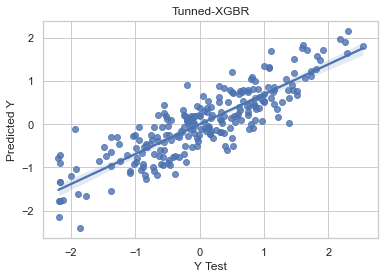

In [312]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Tunned-XGBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

##### Conclusion:

After using two different techniques of tunning the parameters of XGB regressor Algorithm. {GridSearchCV & OPTUNA}

The OPTUNA one was better than GridSearch in all the evaluation metrics also in the cross validation performance, But the 
orginal XGB Model before tunning is the best one in all the evaluation metrics but not in the CV as it score almost 53%
Therefor i will go with the Orginal XGB regressor Model to be my Final used Model.
*******************************************************************************************************************************
Evaluation Metrics & CV results:
    
The r2 score_train is: 0.9269735738236903
The r2 score_test is: 0.9073744789062477

The mean absolute error 0.12484102258640235

The mean squared error 0.09212099897160891

The cross validation score 0.5320249992649468 0.15967725491526194

-------------------------------------------------------------------------------------------------------------------------------

### Saving the Model

In [313]:
#Saving the model using .pkl
joblib.dump(xgb,'E:/DataTrained/Capstone_Project/IMDB_Gross_XGB.pkl')

['E:/DataTrained/Capstone_Project/IMDB_Gross_XGB.pkl']

In [314]:
# load model and get predictions

model=joblib.load('E:/DataTrained/Capstone_Project/IMDB_Gross_XGB.pkl')

In [316]:
#Predict

prediction= model.predict(x_test)

pd.DataFrame([model.predict(x_test)[:], y_test[:]], index = ['Predicted', 'Original'])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239
Predicted,0.567931,-0.302579,-0.689199,0.796935,0.879823,-1.114828,1.053860,0.160226,-1.068380,-0.875270,0.989762,2.311852,0.757163,-0.506027,1.930611,0.301483,-0.723378,0.100598,0.709989,0.730639,1.480736,-0.461904,1.730048,0.516796,0.817807,1.687687,0.972224,-0.676625,0.438183,-0.275410,0.437760,-1.332111,0.101193,0.391603,-0.107354,0.999191,-0.452860,-0.054178,1.239962,-0.836342,-0.243007,0.472206,-0.762668,-0.126056,0.271840,-0.730024,-0.709400,0.219027,-0.932045,-2.131837,-0.552216,1.399753,1.488714,-1.366541,-0.225775,0.300819,0.003604,-0.150094,0.832958,0.641373,1.004844,-1.043118,-0.177613,-0.781033,0.360182,-0.829504,0.795375,0.077225,0.316575,-1.099169,-0.711216,0.959053,-0.786853,-2.172341,0.390221,0.621310,-1.871398,-1.392789,-0.393444,0.110925,-0.525367,-0.079632,-0.221946,-0.202303,-0.105703,0.856776,0.010434,-0.677634,0.040218,-0.447425,-0.310716,0.801807,1.345957,-0.515236,1.281377,-0.506076,1.621385,-2.201690,-1.934663,1.612446,-0.015673,1.057411,-0.388153,1.663306,0.832745,0.872014,-1.634666,-1.888594,0.604808,-0.422519,1.150481,-1.899417,-1.187725,0.144047,0.060394,1.26753,0.540777,-0.894769,0.812622,-0.172077,0.923487,-1.390203,0.547827,-1.570275,0.751828,1.176341,0.766952,0.145417,-0.028551,0.118085,-0.423312,1.123596,-0.034705,-0.087928,-2.146678,2.316276,-1.432548,-0.484092,-0.733917,2.267278,-0.925892,1.582586,-0.571528,-1.178036,0.101925,1.712697,1.087470,-0.997126,0.306744,0.868152,-0.591420,-0.906098,0.619778,0.113105,-0.155663,0.634738,-0.841557,-1.077768,1.202758,-0.359496,0.917351,0.956918,-0.215470,-0.860875,-0.576061,1.813037,-0.189884,-0.112545,0.007311,-0.619963,-0.845504,-0.678711,0.704379,-0.240035,1.438949,-0.130685,0.102223,1.364968,1.877944,-0.144069,1.138877,-0.453980,0.540138,1.443702,-1.227764,-0.641269,1.562280,0.130935,-0.505886,1.476533,0.962906,1.136336,-1.283114,1.055636,-0.451480,0.021209,0.322092,1.483165,-1.226422,2.185459,-0.094004,0.153716,-0.316370,0.328050,-0.027910,0.754501,0.202762,-0.681828,0.816964,-0.497031,-0.685538,-0.980079,0.197066,-0.883655,0.143643,-1.309292,0.877100,0.770168,-0.486571,-0.817711,-0.551695,-1.918977,-0.576327,0.508396,0.532465,0.674362,-0.636579,-0.192901,0.273983,1.11130,-0.258387,-0.571796,-2.172258,1.224622,-0.315676,0.291624,0.520432,0.384913,0.100497,0.854936
Original,0.575185,-0.293902,-0.717523,0.825074,0.523674,-0.047072,1.065173,0.175644,-2.004867,-0.879791,0.296009,2.294696,0.755932,0.399138,1.915646,0.333633,-0.713925,0.099808,0.750422,0.738469,1.459315,-0.547613,1.733854,0.501510,0.748256,2.534884,1.001935,-0.968293,0.464175,-0.282883,0.499712,-1.373471,0.062003,0.430147,-0.122702,0.992152,-0.471891,-0.028688,0.829704,-0.842055,-0.241226,1.148208,-0.491903,-0.199255,0.259751,-0.727304,-0.763662,0.206624,-0.328862,-2.127179,-0.558937,1.382798,1.511417,-1.378162,-0.247679,0.312305,0.001662,-0.167774,0.131798,0.616647,1.007171,-2.170977,-0.180352,-0.778907,0.372072,-0.827381,0.795421,0.070719,0.336239,-1.088637,-0.710698,0.963000,-0.818526,-2.183407,0.384276,0.648291,-1.854892,-2.174052,-0.378377,0.135341,-0.483566,-0.079276,-0.235266,-0.872544,-0.099875,0.966109,-0.009632,-0.598783,0.172538,-0.456149,-0

The results are very good.